<a href="https://colab.research.google.com/github/micah-shull/pipelines/blob/main/pipelines_16_ensemble_047_class_specific_thresholds_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



### Problem of Class Imbalance

**Class imbalance** occurs when one class in a dataset significantly outnumbers the other classes. This is common in many real-world scenarios, such as fraud detection, medical diagnoses, and loan defaults. In such cases, the majority class (the more frequent class) dominates the dataset, while the minority class (the less frequent class) is underrepresented.

### Impact on Model Performance

When training a machine learning model on imbalanced data, the model tends to become biased towards the majority class. This bias can lead to the following issues:

1. **High Accuracy but Poor Minority Class Performance**: The model may achieve high overall accuracy by simply predicting the majority class most of the time. However, it will likely perform poorly on the minority class, failing to identify critical instances.

2. **High Precision and Recall for the Majority Class**: Precision and recall scores for the majority class may be high because the model is good at predicting the majority class correctly. However, this often comes at the expense of poor performance for the minority class.

3. **Low Precision and Recall for the Minority Class**: Precision and recall scores for the minority class are typically low because the model struggles to correctly identify minority class instances. This is problematic in scenarios where identifying the minority class correctly is crucial (e.g., detecting fraudulent transactions or diagnosing diseases).

### Checking for Class Imbalance Issues

To check for the impact of class imbalance on model performance, you can:

1. **Analyze Class Distribution**: Examine the distribution of classes in your dataset. If there is a significant imbalance, it indicates a potential issue.

2. **Evaluate Precision and Recall Scores**: Assess precision and recall scores for both the majority and minority classes. High precision and recall for the majority class and low scores for the minority class suggest that the model is biased towards the majority class.

3. **Confusion Matrix**: A confusion matrix provides a detailed breakdown of true positives, false positives, true negatives, and false negatives for each class. This helps in understanding how well the model performs on each class.

4. **F1 Score**: The F1 score, which is the harmonic mean of precision and recall, can be calculated for both classes. A low F1 score for the minority class indicates poor performance.

### Addressing Class Imbalance

To address class imbalance and improve model performance on the minority class, you can:

1. **Resampling Techniques**: Use techniques like oversampling (e.g., SMOTE) to increase the number of minority class instances, or undersampling to reduce the number of majority class instances.

2. **Class Weight Adjustment**: Adjust class weights in your model to give more importance to the minority class. This helps the model focus on learning to identify minority class instances better.

3. **Ensemble Methods**: Use ensemble methods like bagging and boosting, which can help improve the performance of models on imbalanced data.

4. **Threshold Tuning**: Adjust the decision threshold to balance precision and recall for the minority class.

By implementing these techniques, you can create more balanced models that perform well on both the majority and minority classes, leading to more reliable and accurate predictions.

## Load & Preprocess Data

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
import json
import warnings
from loan_data_utils import load_and_preprocess_data, plot_class_distribution, plot_mean_class_metrics, get_top_performers, evaluate_model
from threshold_utils import find_optimal_thresholds, find_optimal_threshold_for_recall, custom_loss, grid_search_threshold, roc_analysis, evaluate_models, plot_results, plot_roc_results, update_and_save_optimal_thresholds
# Suppress warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Define your URL, categorical columns, and target
url = "https://archive.ics.uci.edu/ml/machine-learning-databases/00350/default%20of%20credit%20card%20clients.xls"
categorical_columns = ['sex', 'education', 'marriage']
target = 'default_payment_next_month'

# Load and preprocess data
X, y = load_and_preprocess_data(url, categorical_columns, target)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Identify numeric and categorical columns
numeric_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['category']).columns.tolist()

# Define the column transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), numeric_features),
        ('cat', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='most_frequent')),
            ('encoder', OneHotEncoder(drop='first'))
        ]), categorical_features)
    ])


#### Class Imbalance Plots

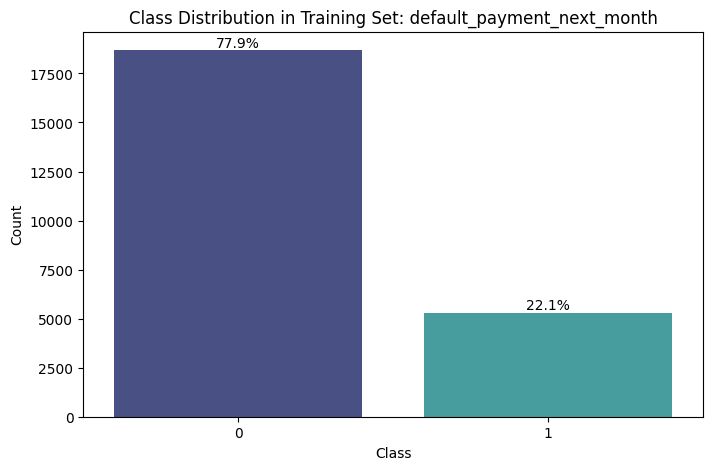

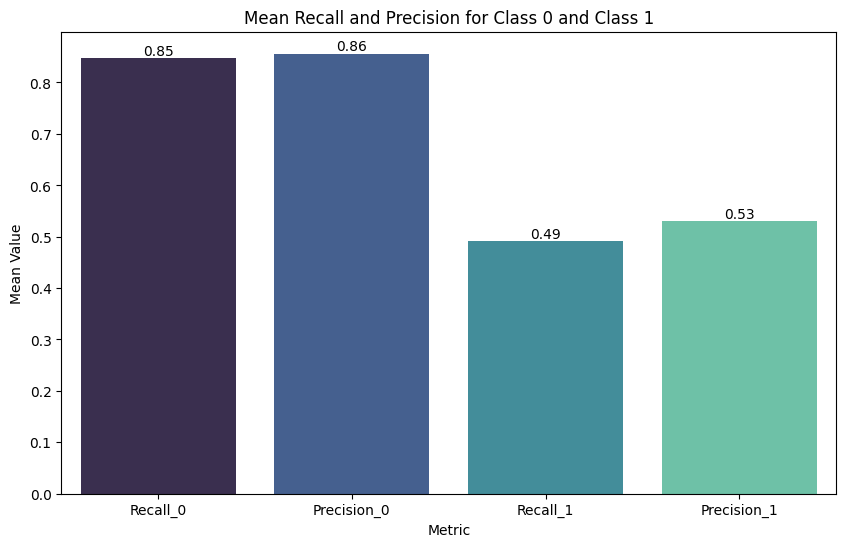

In [5]:
from loan_data_utils import plot_mean_class_metrics
# Load the CSV file into a DataFrame
file_path = '/content/combined_model_metrics_with_resampling.csv'
metrics_df = pd.read_csv(file_path)

# plot metrics
plot_class_distribution(y_train, target)
plot_mean_class_metrics(metrics_df)

In [6]:
# get_top_performers(metrics_df, top_n=3)
from loan_data_utils import get_top_performers, select_and_sort_top_n

columns_to_check = ['Recall_0', 'Precision_0', 'F1_0', 'Recall_1',
                    'Precision_1', 'F1_1', 'F1_Macro', 'Accuracy']
top3_combined_df = select_and_sort_top_n(metrics_df, columns_to_check, n=3)
top3_combined_df

,Model,Experiment,Recall_0,Precision_0,F1_0,Recall_1,Precision_1,F1_1,F1_Macro,Accuracy
0,Logistic Regression,baseline,0.969399,0.818724,0.887713,0.244160,0.693790,0.361204,0.624459,0.809000
1,LGBM,baseline,0.947143,0.840486,0.890633,0.366993,0.663488,0.472586,0.681609,0.818833
2,Random Forest,class_weight_balanced,0.947143,0.835094,0.887597,0.341372,0.647143,0.446966,0.667281,0.813167
3,LGBM (RandomUnderSampler),resampling,0.770383,0.882786,0.822763,0.639789,0.441727,0.522622,0.672693,0.741500
4,HistGradientBoosting (RandomUnderSampler),resampling,0.786433,0.881929,0.831448,0.629239,0.455537,0.528481,0.679964,0.751667
5,Random Forest (RandomUnderSampler),resampling,0.775947,0.880738,0.825028,0.629992,0.443972,0.520872,0.672950,0.743667
6,HistGradientBoosting,baseline,0.942863,0.840198,0.888575,0.368500,0.646825,0.469515,0.679045,0.815833
7,HistGradientBoosting,class_weight_balanced,0.942863,0.840198,0.888575,0.368500,0.646825,0.469515,0.679045,0.815833
8,Logistic Regression (ADASYN),resampling,0.629360,0.869347,0.730139,0.666918,0.338173,0.448783,0.589461,0.637667
9,Logistic Regression (SMOTE),resampling,0.677509,0.867160,0.760692,0.634514,0.358450,0.458107,0.609399,0.668000




### Precision-Recall Trade-off
- **Recall (Sensitivity)**: Measures the ability of a model to identify all relevant instances (true positives). High recall means that most actual positives are identified, but it may include many false positives.
- **Precision**: Measures the ability of a model to return only relevant instances (true positives). High precision means that most identified positives are actual positives, but it may miss many actual positives.

### Precision-Recall Curve
The precision-recall curve is a plot of precision versus recall for different threshold values. As you lower the threshold to classify an instance as positive, recall increases but precision decreases because more false positives are included. Conversely, as you raise the threshold, precision increases but recall decreases because more actual positives are missed.

### The Point Where Precision and Recall are Both 0.5
If a model has precision and recall both around 0.5, it means:
- **Precision = 0.5**: Half of the predicted positives are actual positives.
- **Recall = 0.5**: Half of the actual positives are identified.
  
This performance is generally poor, as it indicates the model is performing only slightly better than random guessing for a balanced dataset. For imbalanced datasets, this might still be quite poor.

### Why Convergence Around 0.5 is Not Optimal
1. **Performance**: Precision and recall both being around 0.5 suggest the model is not effectively distinguishing between the classes. This is typically not desirable for most applications where we aim for higher precision, recall, or a balance that yields better performance.

2. **Threshold Choice**: The optimal threshold is not necessarily the point where precision and recall are equal. It should be chosen based on the specific application's requirements:
   - **High Recall**: If missing a positive case is very costly (e.g., in medical diagnosis), a lower threshold may be preferred to ensure high recall.
   - **High Precision**: If false positives are very costly (e.g., in spam detection), a higher threshold may be preferred to ensure high precision.

3. **F1 Score and Other Metrics**: Often, the F1 score (harmonic mean of precision and recall) is used to find a balance between precision and recall. The optimal threshold may be where the F1 score is maximized, not where precision and recall are equal.

### Finding the Optimal Point
- **Precision-Recall Trade-off**: The best threshold is where the trade-off between precision and recall meets the application's needs. This might be different from 0.5 for skewed data or when different costs are associated with false positives and false negatives.
- **Metrics**: Use metrics like F1 score, ROC-AUC, or custom cost functions to determine the optimal threshold.

### Conclusion
The point where precision and recall are both around 0.5 is not typically considered optimal for model performance. Instead, the optimal point depends on the specific context and cost of errors in the application. Balancing precision and recall to maximize a metric like the F1 score or using application-specific criteria is generally the better approach.

### Class Speciifc Thresholds

A class-specific threshold setup is a technique used in classification tasks to handle imbalanced datasets by adjusting the decision threshold for each class separately. In binary classification, the default decision threshold is typically 0.5, meaning that if the predicted probability of the positive class (class 1) is greater than or equal to 0.5, the instance is classified as positive; otherwise, it is classified as negative (class 0).

### What It Is
A class-specific threshold setup involves setting different thresholds for the positive and negative classes. For instance, you might set a lower threshold for classifying an instance as positive (e.g., 0.3) and a higher threshold for classifying an instance as negative (e.g., 0.7). This means that:
- If the predicted probability is above 0.7, classify the instance as negative.
- If the predicted probability is below 0.3, classify the instance as positive.
- If the predicted probability falls between 0.3 and 0.7, further rules or decisions can be applied.

### What It Does
This setup aims to address the issue of class imbalance where one class significantly outnumbers the other. By adjusting thresholds, you can control the trade-off between precision and recall for each class. For example:
- **Lowering the threshold for class 1 (positive class)**: This increases the recall for class 1, meaning more true positives are identified. However, it may also increase the number of false positives.
- **Raising the threshold for class 0 (negative class)**: This increases the precision for class 0, meaning fewer false positives are identified. However, it may also decrease the recall for class 0.

### How It Affects Performance
Adjusting class-specific thresholds can significantly impact model performance, especially in terms of precision, recall, and the overall F1 score for each class:

1. **Recall**: Lowering the threshold for the minority class (e.g., class 1) can improve recall, capturing more true positives. This is crucial in applications where missing out on positives is costly, such as fraud detection or medical diagnosis.

2. **Precision**: Raising the threshold for the minority class can improve precision, reducing false positives. This is important when the cost of false positives is high, such as in spam detection or automated trading systems.

3. **F1 Score**: The F1 score, which is the harmonic mean of precision and recall, can be optimized by carefully selecting class-specific thresholds. Balancing the thresholds to achieve an optimal F1 score helps in scenarios where both false positives and false negatives carry significant costs.

4. **Class Imbalance**: In highly imbalanced datasets, using a single threshold may lead to biased models that favor the majority class. Class-specific thresholds help mitigate this bias by giving more weight to the minority class, leading to more balanced performance metrics.

5. **Model Robustness**: Fine-tuning thresholds can make models more robust to variations in data distribution, especially when the cost of different types of misclassification is asymmetric.

### Practical Considerations
- **Cross-Validation**: It's essential to use cross-validation to determine the optimal thresholds for each class, ensuring the model generalizes well to unseen data.
- **Cost-Sensitive Learning**: Combining class-specific thresholds with cost-sensitive learning can further enhance performance by explicitly accounting for the different costs of false positives and false negatives.
- **Evaluation Metrics**: Always consider multiple evaluation metrics (e.g., precision, recall, F1 score, ROC-AUC) to get a comprehensive view of model performance and the impact of threshold adjustments.

In summary, class-specific thresholds are a powerful technique to improve the performance of classification models on imbalanced datasets. By carefully selecting and tuning these thresholds, you can better manage the trade-offs between different performance metrics and create models that are more suited to the specific needs of your application.

In [7]:
# Load the optimal parameters and thresholds from the JSON file
with open('optimal_model_params.json', 'r') as file:
    optimal_params = json.load(file)

for class_metric, models in optimal_params.items():
      print(class_metric, models)

Class 1 Recall {'Logistic Regression (ADASYN)': {'best_params': {'C': 6.7, 'solver': 'liblinear'}, 'best_threshold': 0.2}, 'Logistic Regression (SMOTE)': {'best_params': {'C': 10.0, 'solver': 'liblinear'}, 'best_threshold': 0.2}, 'LGBM (SMOTE)': {'best_params': {'learning_rate': 0.2, 'n_estimators': 300, 'num_leaves': 31}, 'best_threshold': 0.1}}
Class 1 Precision {'Logistic Regression (baseline)': {'best_params': {'C': 10.0, 'penalty': 'l2', 'solver': 'liblinear'}, 'best_threshold': 0.5}, 'LGBM (baseline)': {'best_params': {'learning_rate': 0.01, 'n_estimators': 100, 'num_leaves': 70}, 'best_threshold': 0.5}, 'Random Forest (class_weight_balanced)': {'best_params': {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}, 'best_threshold': 0.5}}
Class 0 Recall {'Logistic Regression (baseline)': {'best_params': {'C': 0.01, 'solver': 'liblinear'}, 'best_threshold': 0.1}, 'LGBM (baseline)': {'best_params': {'learning_rate': 0.05, 'n_estimators': 100, 'num_leaves': 31}, 'best_thre

### Functions

In [8]:
# Function to evaluate models with different optimization functions
# def evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, optimization_function, thresholds=None):
#     results = {}
#     for name, (model, sampler) in models.items():
#         pipeline = ImbPipeline([
#             ('preprocessor', preprocessor),
#             ('sampler', sampler) if sampler else ('passthrough', None),
#             ('classifier', model)
#         ])

#         pipeline.fit(X_train, y_train)
#         y_proba = pipeline.predict_proba(X_test)[:, 1]

#         if optimization_function == custom_loss:
#             best_threshold, precision, recall, f1_scores, thresholds = optimization_function(y_test, y_proba)
#         elif optimization_function == grid_search_threshold:
#             if thresholds is None:
#                 thresholds = np.arange(0.0, 1.0, 0.01)
#             best_threshold, precision, recall, best_score = optimization_function(y_test, y_proba, thresholds)
#             f1_scores = 2 * (precision * recall) / (precision + recall)
#         elif optimization_function == roc_analysis:
#             best_threshold, fpr, tpr, thresholds = optimization_function(y_test, y_proba)
#             precision, recall, f1_scores = None, None, None  # Not computed in ROC analysis
#         else:
#             best_threshold, precision, recall, f1_scores, thresholds = optimization_function(y_test, y_proba)

#         results[name] = {
#             'model': model,
#             'sampler': sampler,
#             'best_threshold': best_threshold,
#             'precision': precision,
#             'recall': recall,
#             'f1_scores': f1_scores,
#             'thresholds': thresholds
#         }
#     return results



## Define Models

In [9]:
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as ImbPipeline
import json

# Load the optimal parameters and thresholds from the JSON file
with open('optimal_model_params.json', 'r') as file:
    optimal_params = json.load(file)

# Define the models with the parameters from the JSON file
models = {
    'Logistic Regression (ADASYN)': (LogisticRegression(**optimal_params['Class 1 Recall']['Logistic Regression (ADASYN)']['best_params']), ADASYN()),
    'Logistic Regression (SMOTE)': (LogisticRegression(**optimal_params['Class 1 Recall']['Logistic Regression (SMOTE)']['best_params']), SMOTE()),
    'LGBM (SMOTE)': (LGBMClassifier(**optimal_params['Class 1 Recall']['LGBM (SMOTE)']['best_params'], force_row_wise=True), SMOTE()),
    'Logistic Regression (baseline)': (LogisticRegression(**optimal_params['Class 1 Precision']['Logistic Regression (baseline)']['best_params']), None),
    'LGBM (baseline)': (LGBMClassifier(**optimal_params['Class 1 Precision']['LGBM (baseline)']['best_params'], force_row_wise=True), None),
    'Random Forest (class_weight_balanced)': (RandomForestClassifier(**optimal_params['Class 1 Precision']['Random Forest (class_weight_balanced)']['best_params']), None),
    'Logistic Regression (baseline) CR': (LogisticRegression(**optimal_params['Class 0 Recall']['Logistic Regression (baseline)']['best_params']), None),
    'LGBM (baseline) CR': (LGBMClassifier(**optimal_params['Class 0 Recall']['LGBM (baseline)']['best_params'], force_row_wise=True), None),
    'Random Forest (class_weight_balanced) CR': (RandomForestClassifier(**optimal_params['Class 0 Recall']['Random Forest (class_weight_balanced)']['best_params']), None),
    'LGBM (RandomUnderSampler)': (LGBMClassifier(**optimal_params['Class 0 Precision']['LGBM (RandomUnderSampler)']['best_params'], force_row_wise=True), RandomUnderSampler()),
    'HistGradientBoosting (RandomUnderSampler)': (LGBMClassifier(**optimal_params['Class 0 Precision']['HistGradientBoosting (RandomUnderSampler)']['best_params']), RandomUnderSampler()),
    'Random Forest (RandomUnderSampler)': (RandomForestClassifier(**optimal_params['Class 0 Precision']['Random Forest (RandomUnderSampler)']['best_params']), RandomUnderSampler()),
}

## Evaluate and Plot

#### F1 score optimization

[LightGBM] [Info] Number of positive: 18691, number of negative: 18691
[LightGBM] [Info] Total Bins 6540
[LightGBM] [Info] Number of data points in the train set: 37382, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639
[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639
[LightGBM] [Info] Number of positive: 5309, number of negativ

/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `max_iter` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_iterations is set=100, max_iter=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 5309, number of negative: 5309
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000848 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3263
[LightGBM] [Info] Number of data points in the train set: 10618, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31


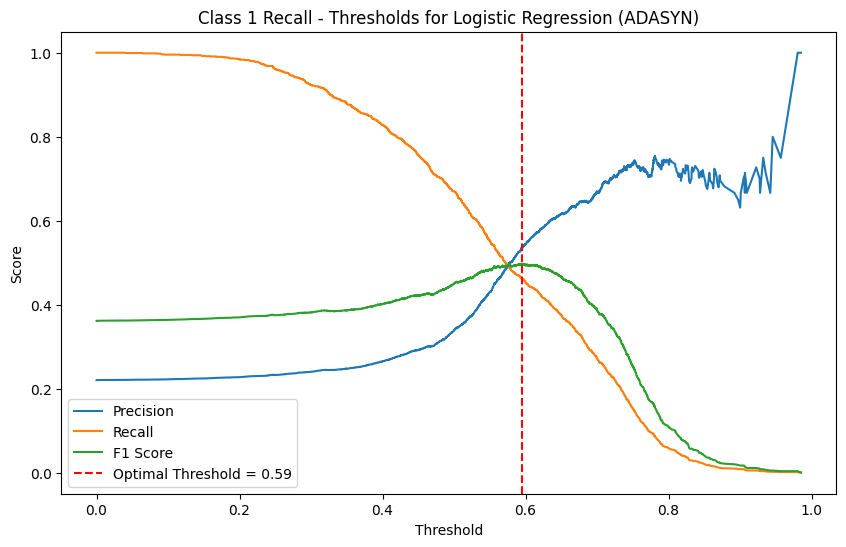

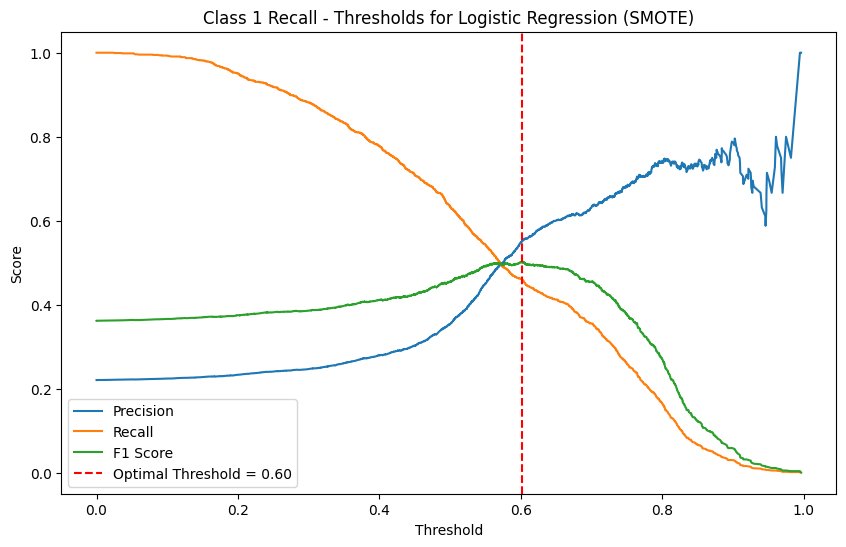

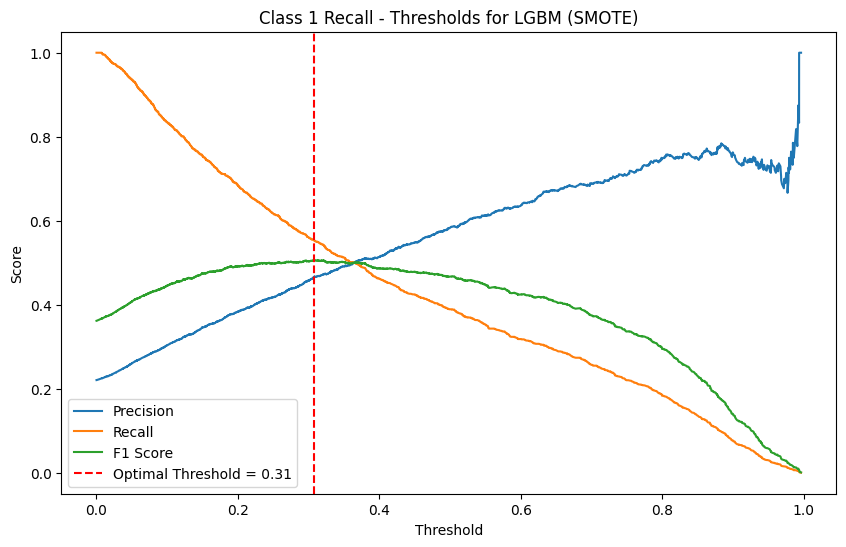

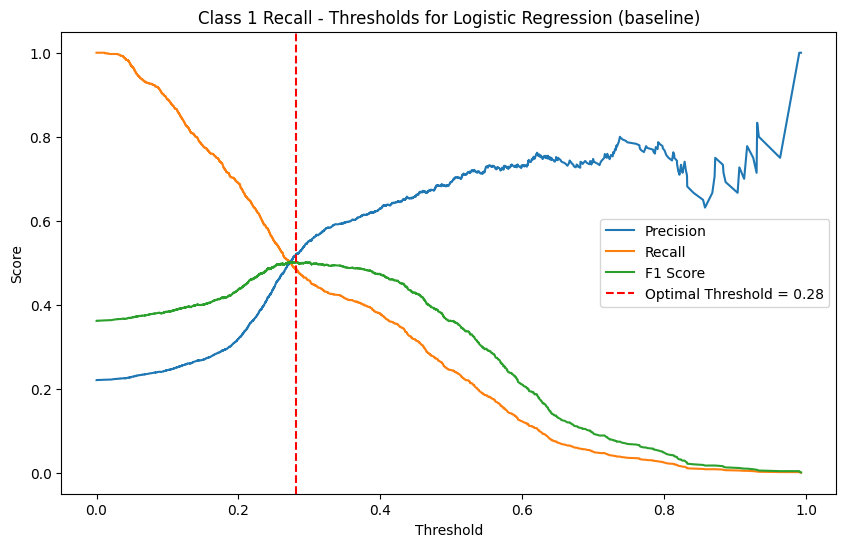

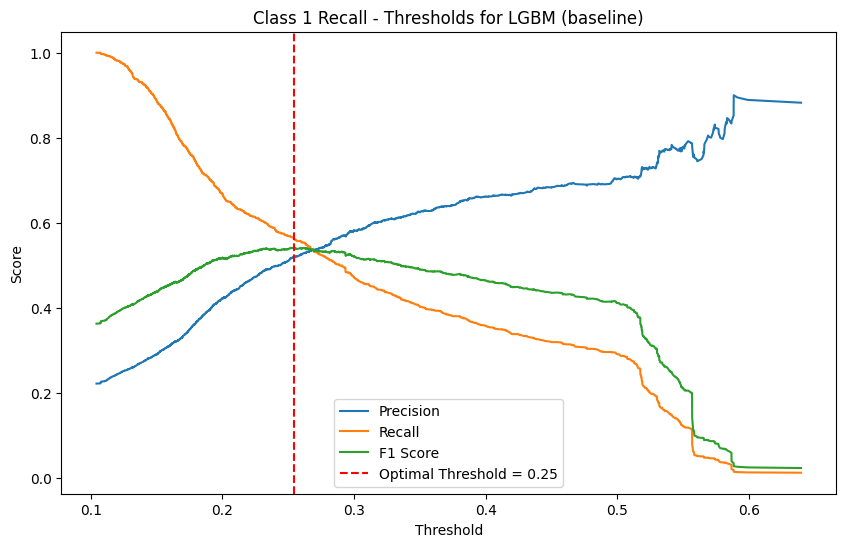

...

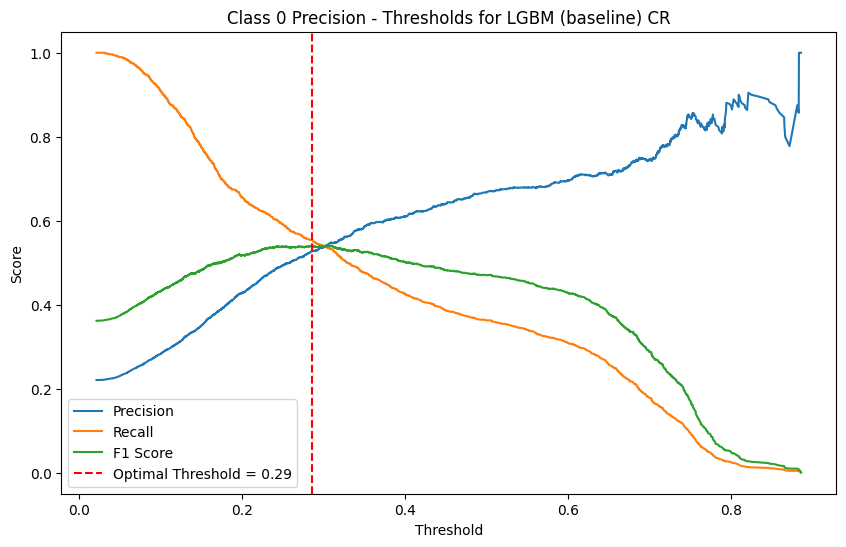

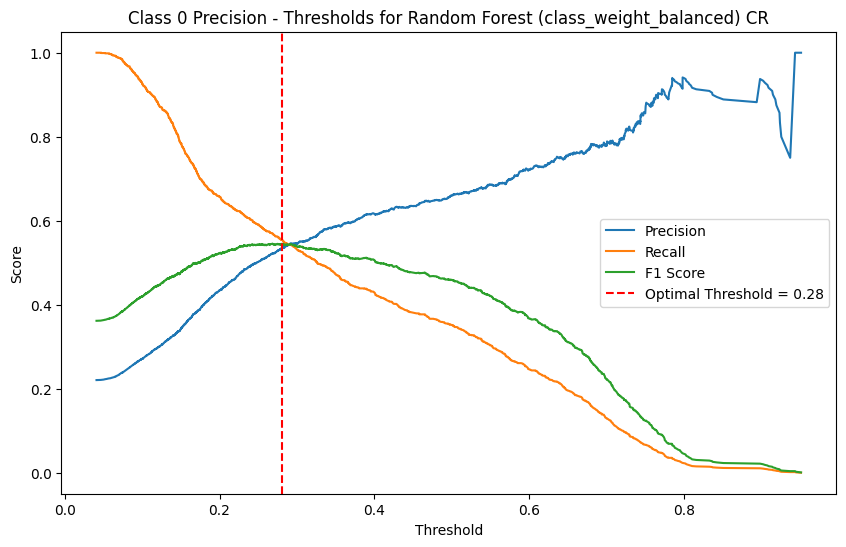

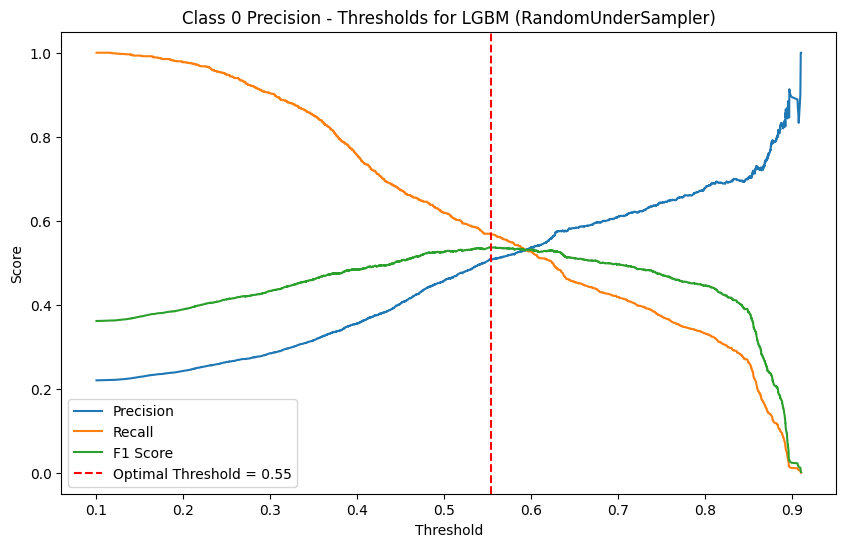

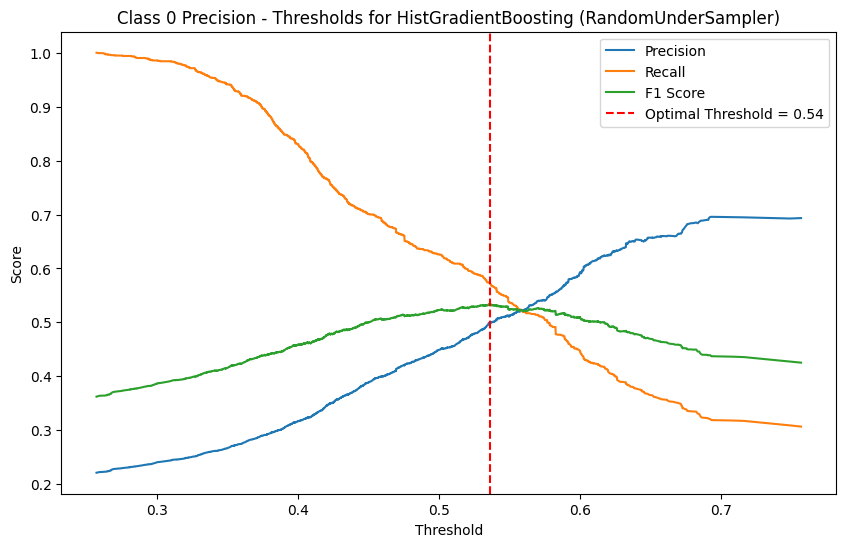

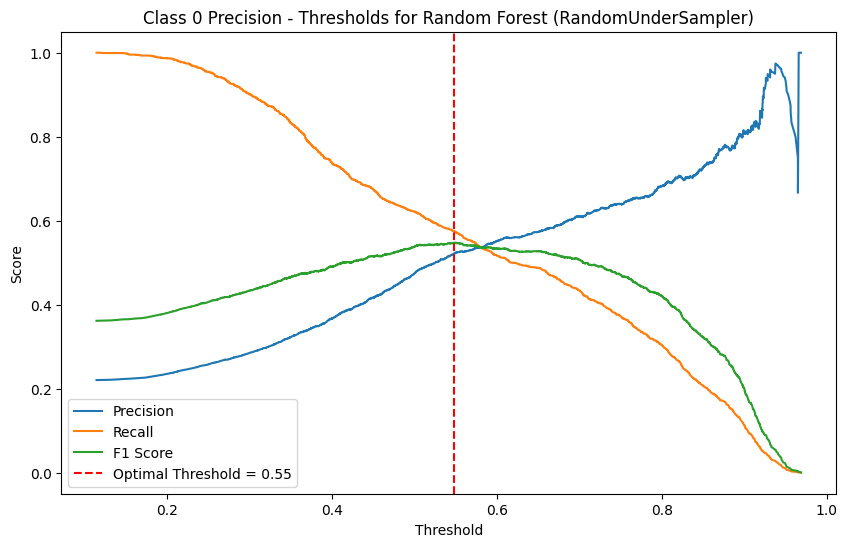

In [11]:
# Evaluate models for F1 score optimization
results_f1 = evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, find_optimal_thresholds)
plot_results(results_f1, optimal_params)

#### Recall Optimization

[LightGBM] [Info] Number of positive: 18691, number of negative: 18691
[LightGBM] [Info] Total Bins 6534
[LightGBM] [Info] Number of data points in the train set: 37382, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/content/threshold_utils.py:50: RuntimeWarning: invalid value encountered in divide
  f1_scores = 2 * (precision * recall) / (precision + recall)


[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639
[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639
[LightGBM] [Info] Number of positive: 5309, number of negative: 5309
[LightGBM] [Info] Total Bins 3264
[LightGBM] [Info] Number of data points in the train set: 10618, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `max_iter` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_iterations is set=100, max_iter=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 5309, number of negative: 5309
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3262
[LightGBM] [Info] Number of data points in the train set: 10618, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31


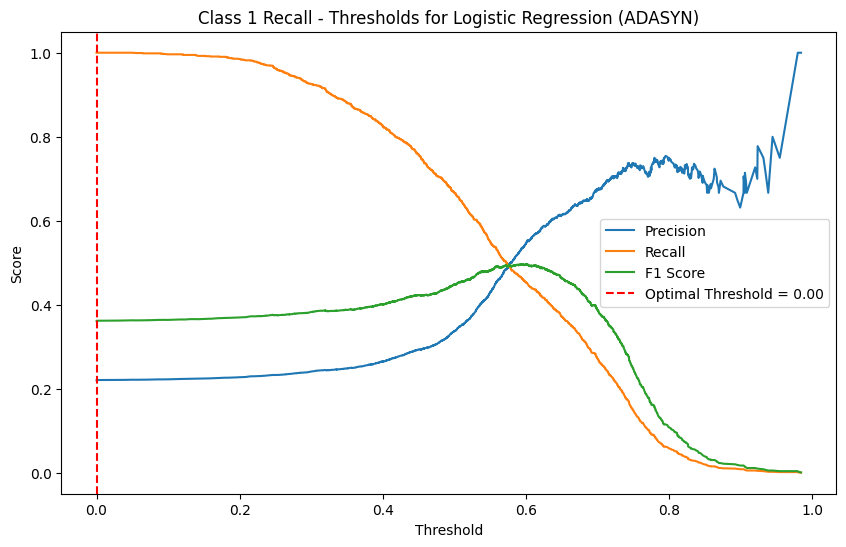

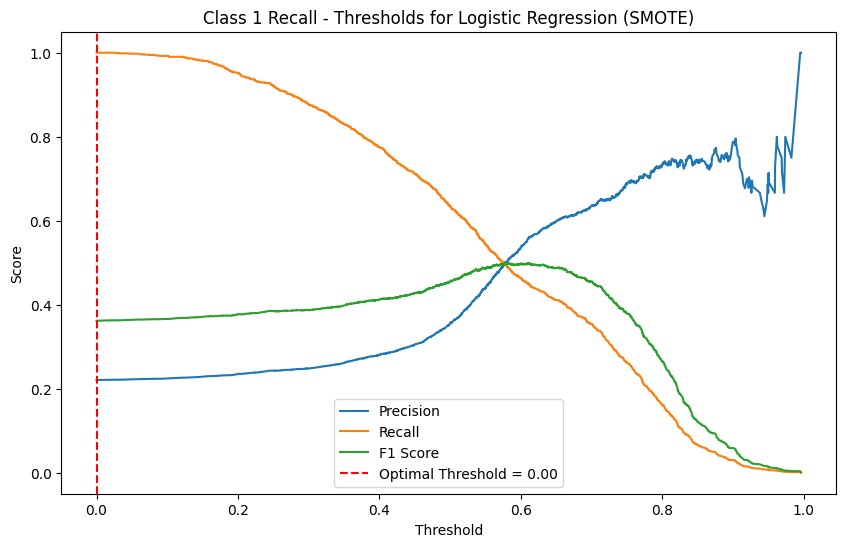

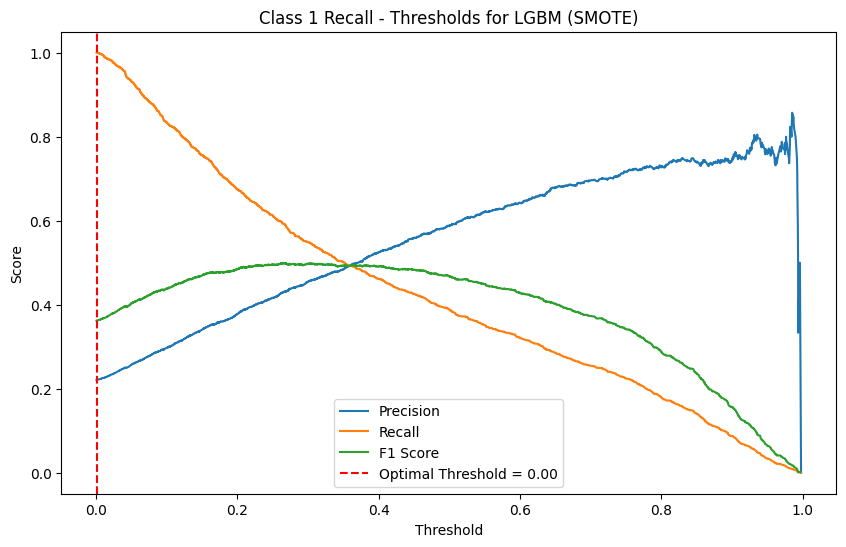

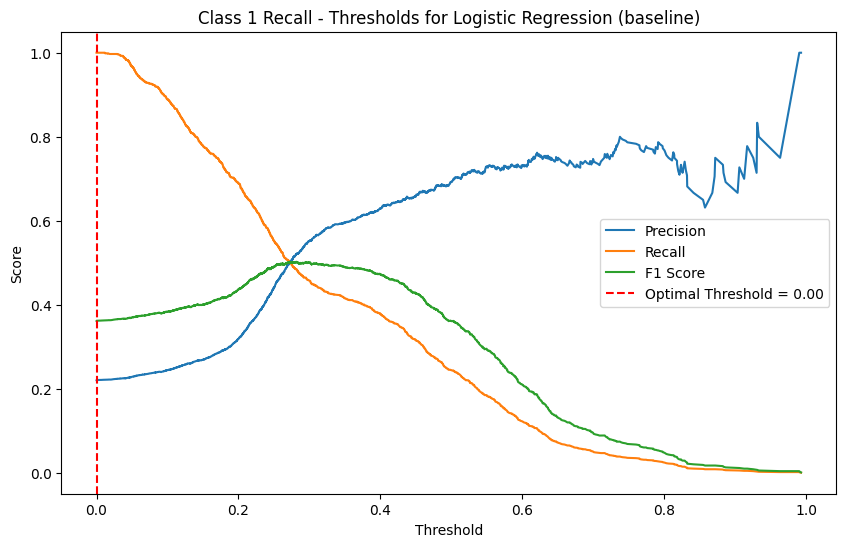

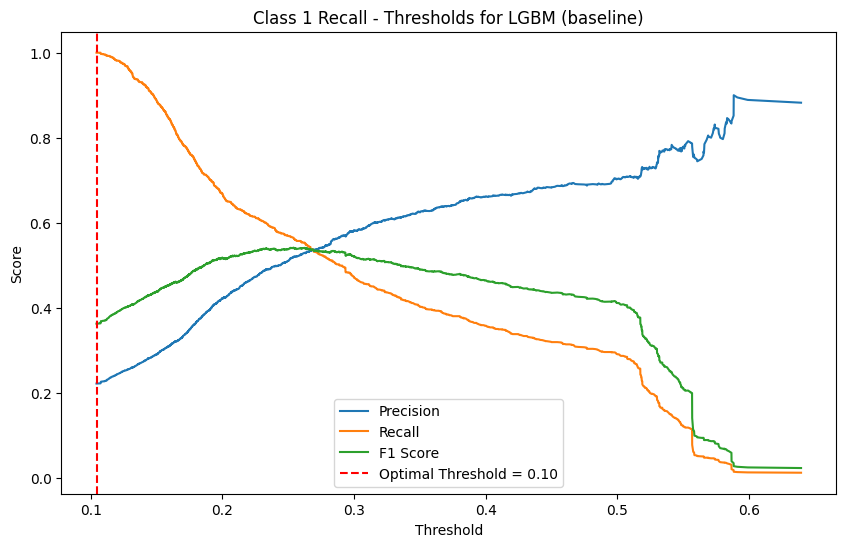

...

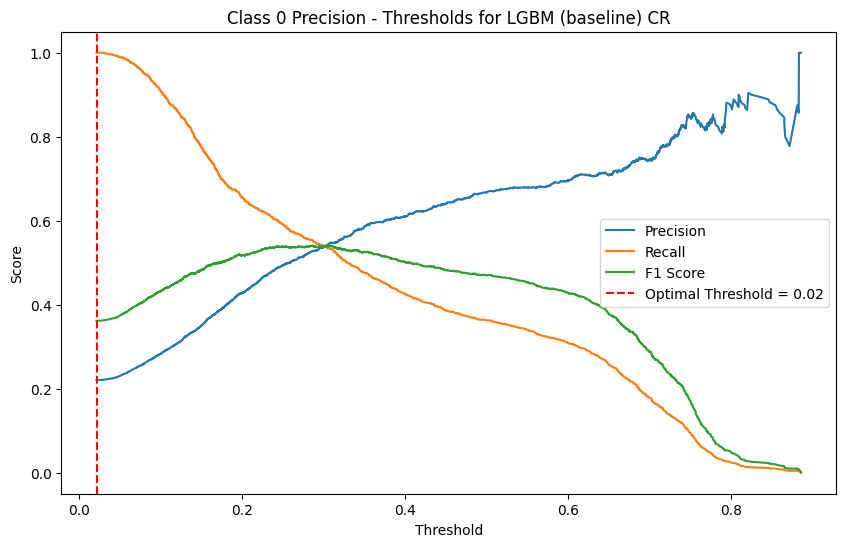

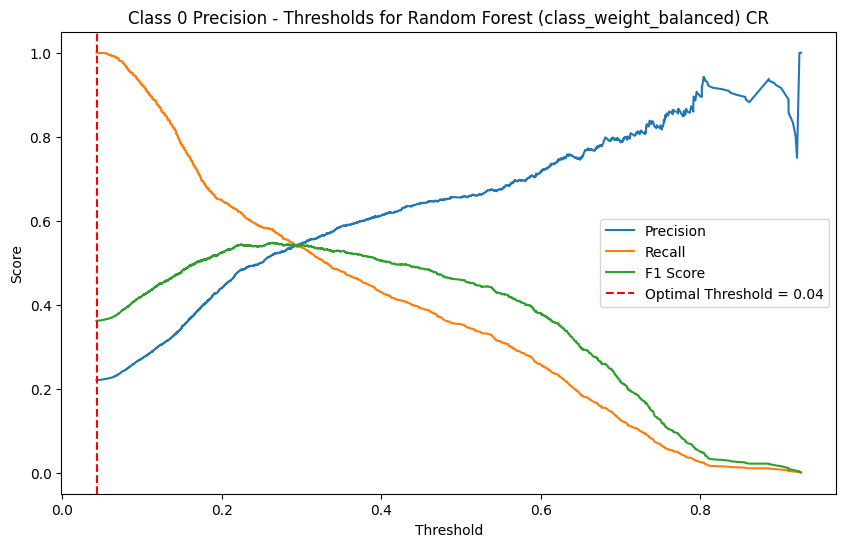

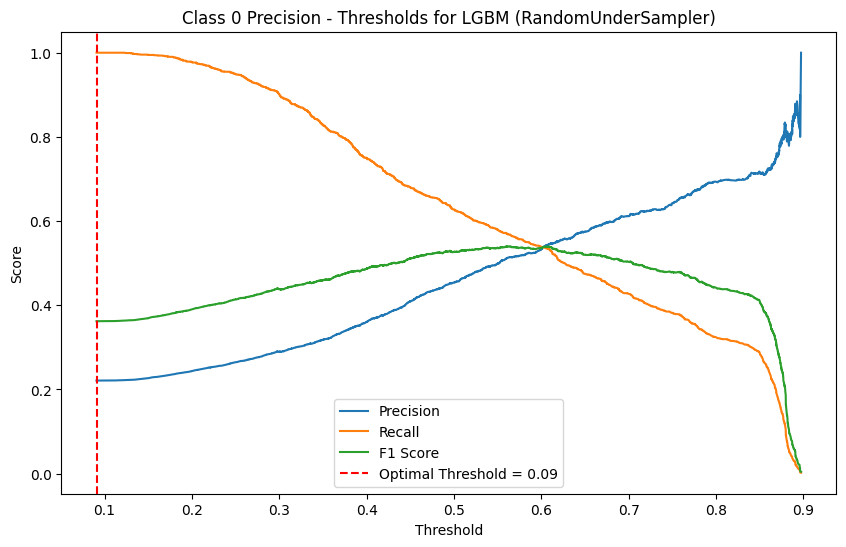

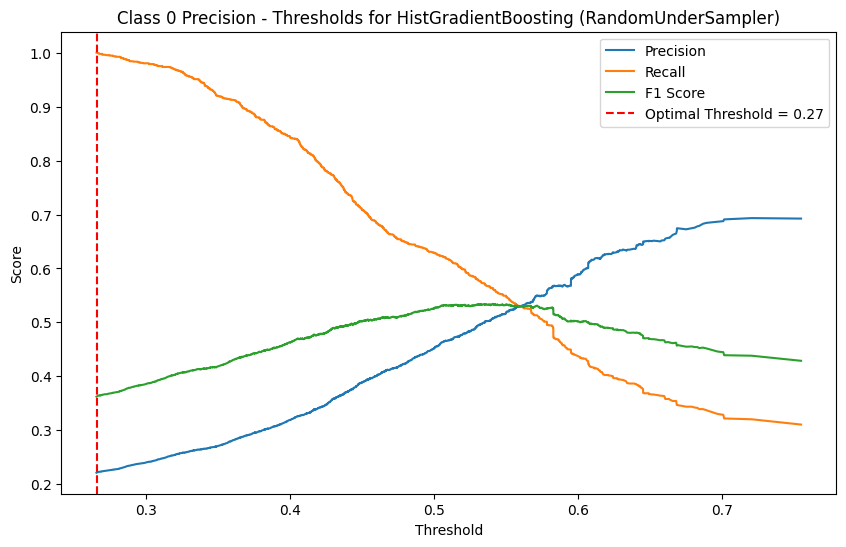

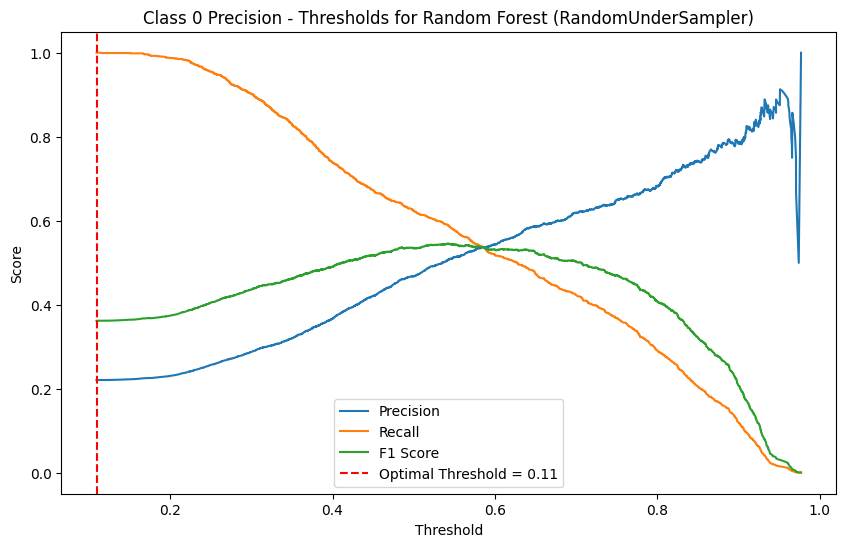

In [12]:
# Evaluate models for recall optimization
results_recall = evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, find_optimal_threshold_for_recall)
plot_results(results_recall, optimal_params)

### Custom Loss

[LightGBM] [Info] Number of positive: 18691, number of negative: 18691
[LightGBM] [Info] Total Bins 6549
[LightGBM] [Info] Number of data points in the train set: 37382, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639
[LightGBM] [Info] Number of positive: 5309, number of negative: 18691
[LightGBM] [Info] Total Bins 3276
[LightGBM] [Info] Number of data points in the train set: 24000, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.221208 -> initscore=-1.258639
[LightGBM] [Info] Start training from score -1.258639


/content/threshold_utils.py:58: RuntimeWarning: invalid value encountered in divide
  f_beta_scores = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall)


[LightGBM] [Info] Number of positive: 5309, number of negative: 5309
[LightGBM] [Info] Total Bins 3265
[LightGBM] [Info] Number of data points in the train set: 10618, number of used features: 30
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


/usr/local/lib/python3.10/dist-packages/lightgbm/engine.py:204: UserWarning: Found `max_iter` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Warning] num_iterations is set=100, max_iter=100 will be ignored. Current value: num_iterations=100
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31
[LightGBM] [Info] Number of positive: 5309, number of negative: 5309
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000829 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3262
[LightGBM] [Info] Number of data points in the train set: 10618, number of used features: 29
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] num_leaves is set=31, max_leaf_nodes=31 will be ignored. Current value: num_leaves=31


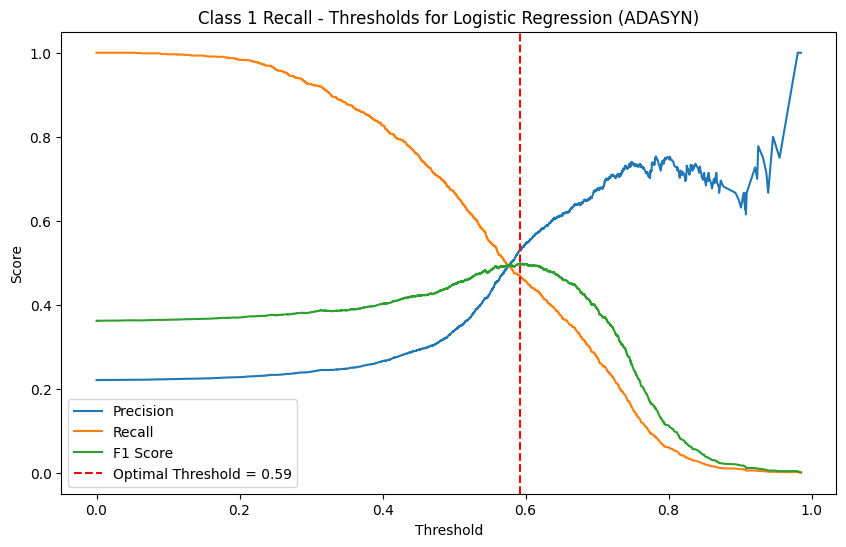

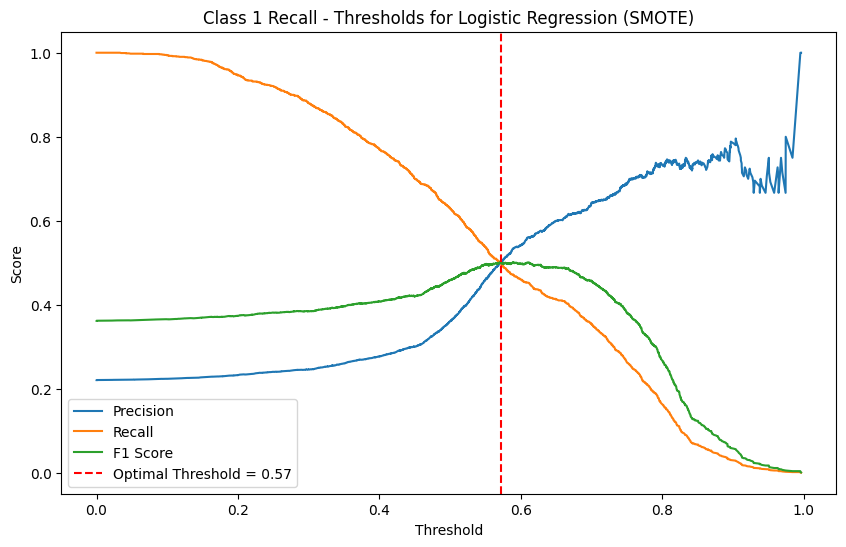

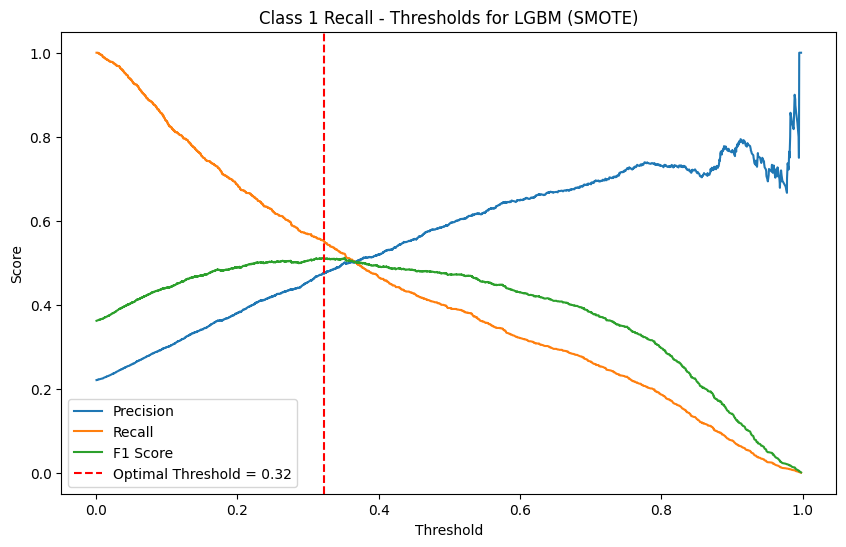

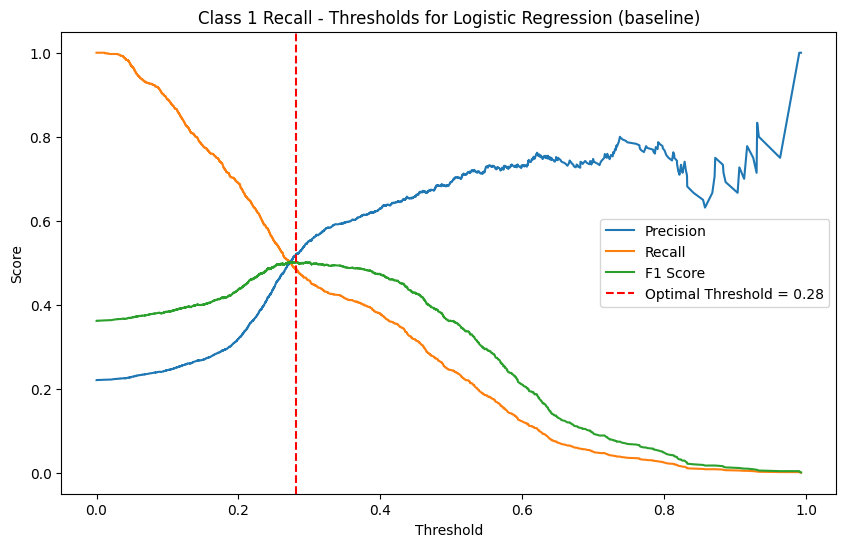

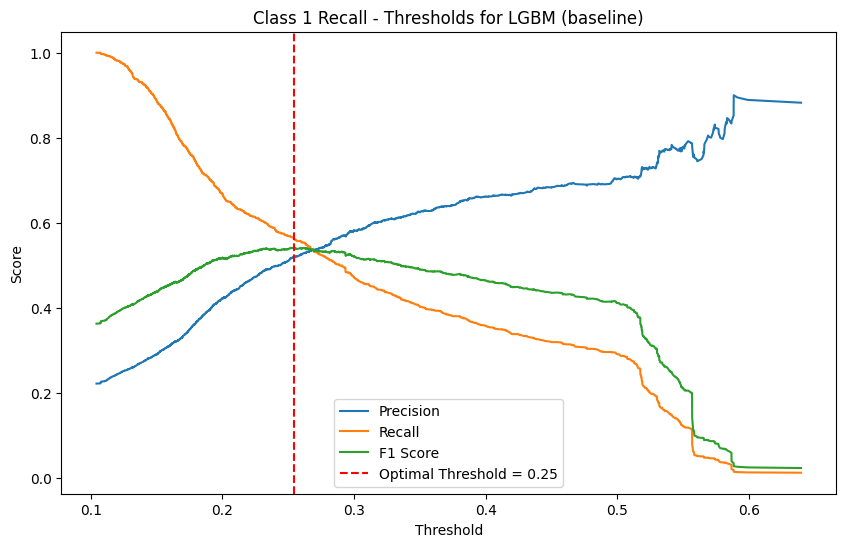

...

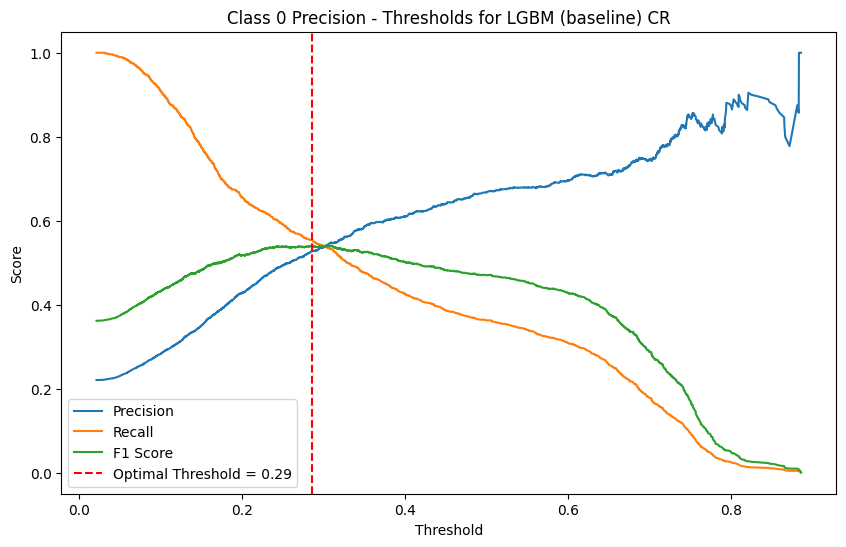

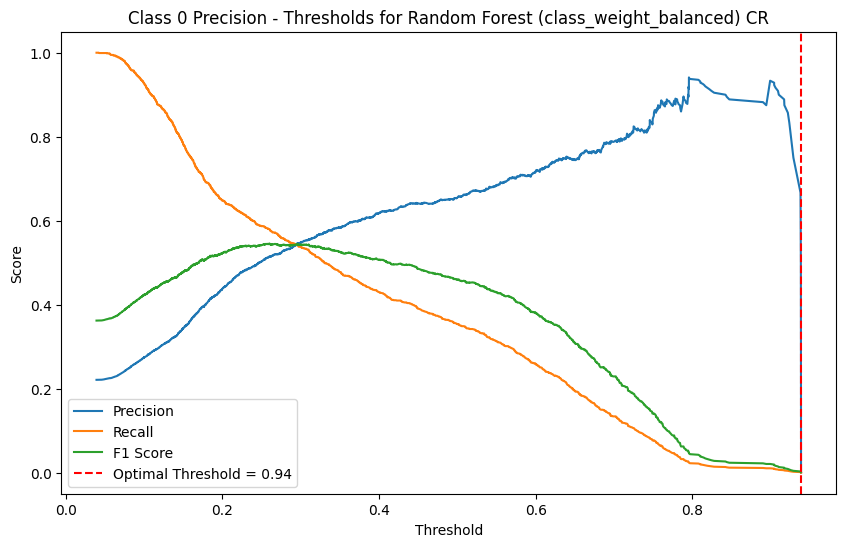

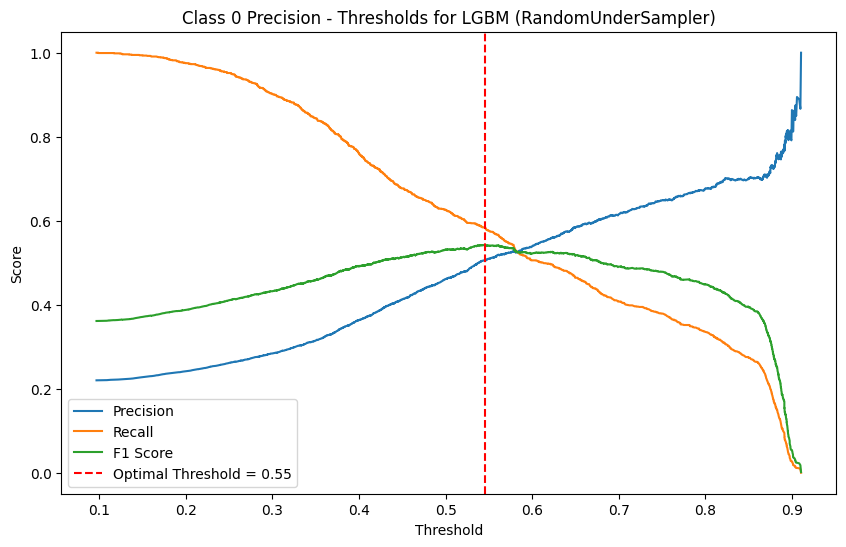

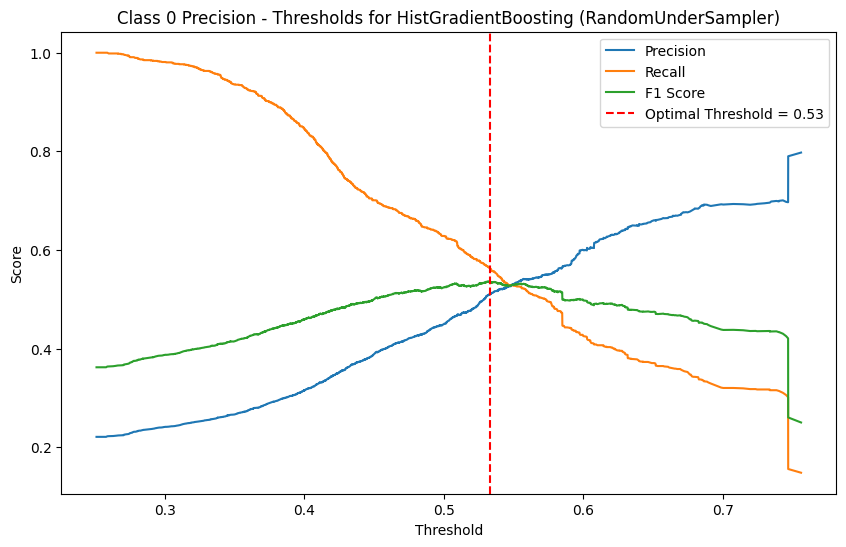

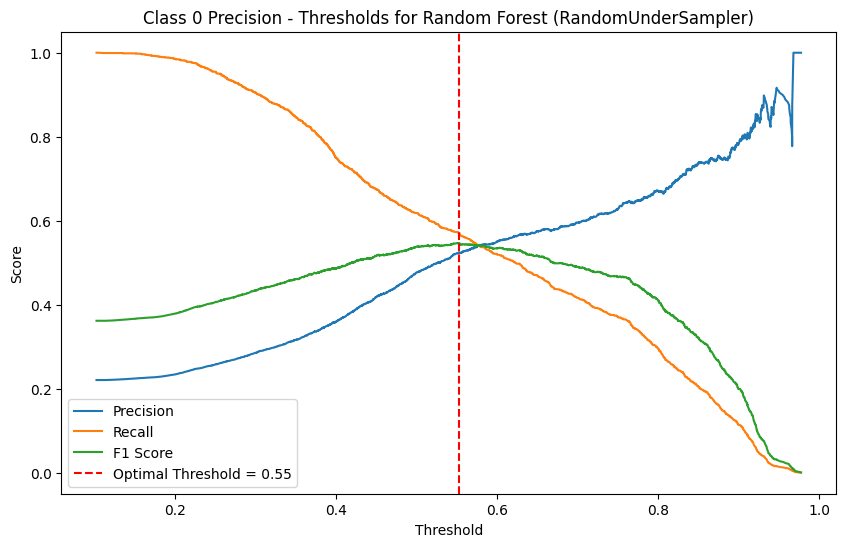

In [13]:
# Evaluate models using custom loss function
results_custom_loss = evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, custom_loss)
plot_results(results_custom_loss, optimal_params)

### Grid Search

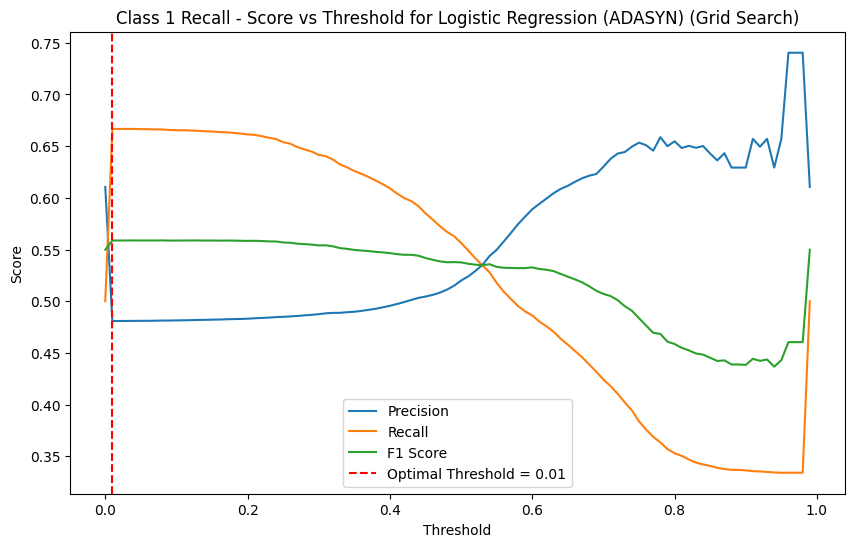

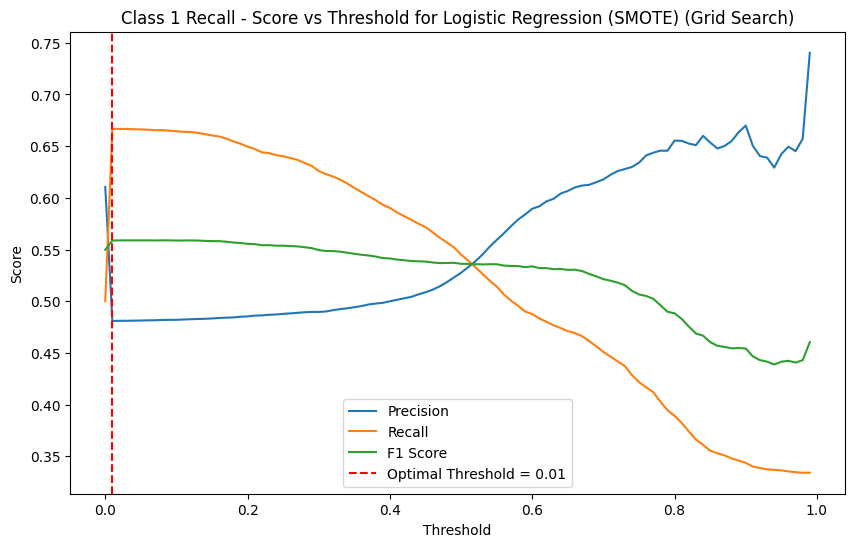

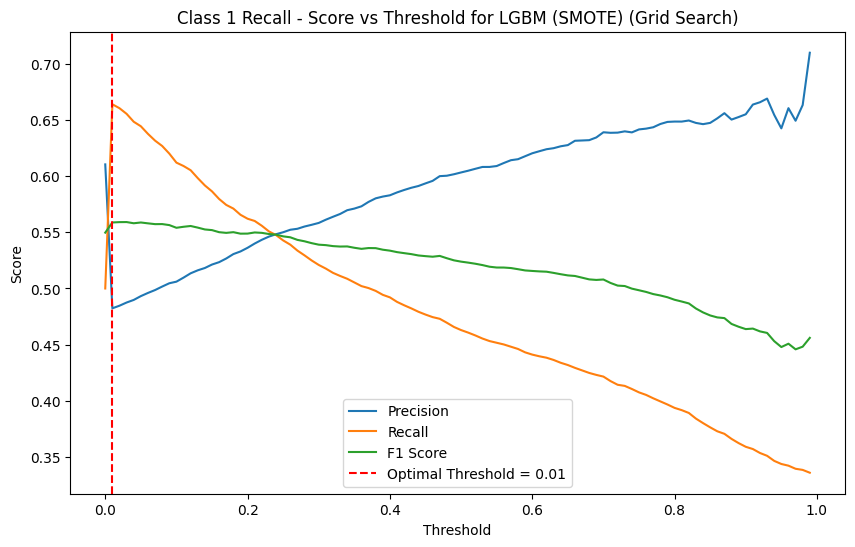

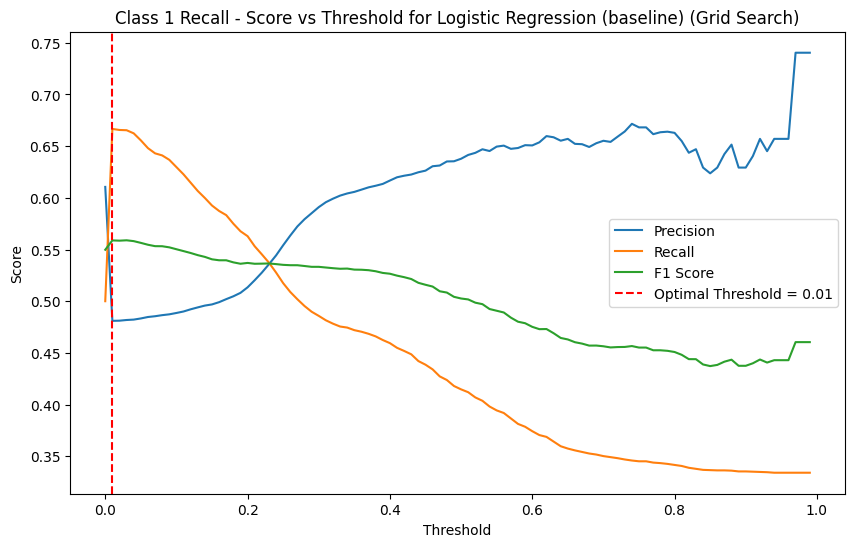

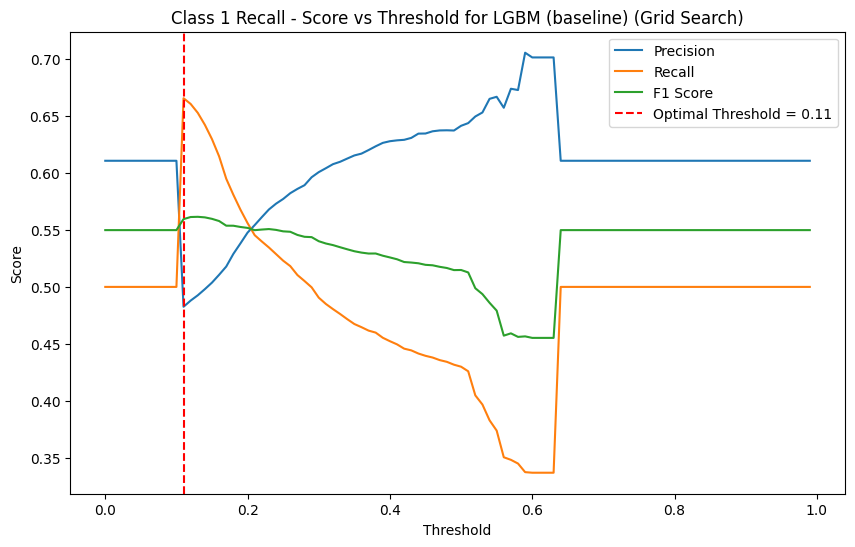

...

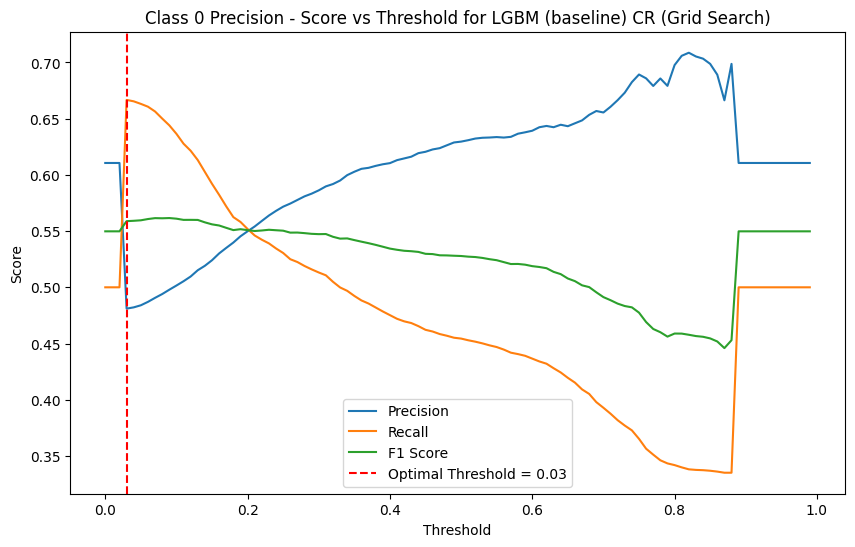

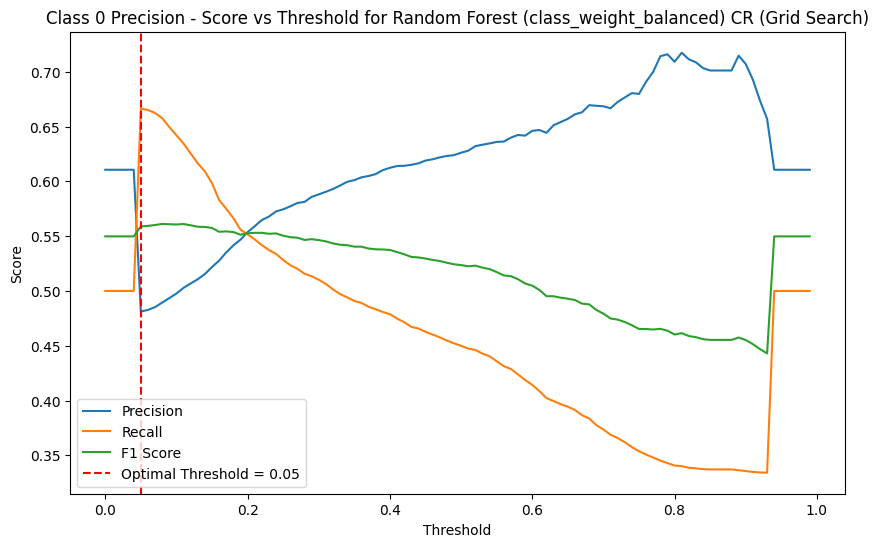

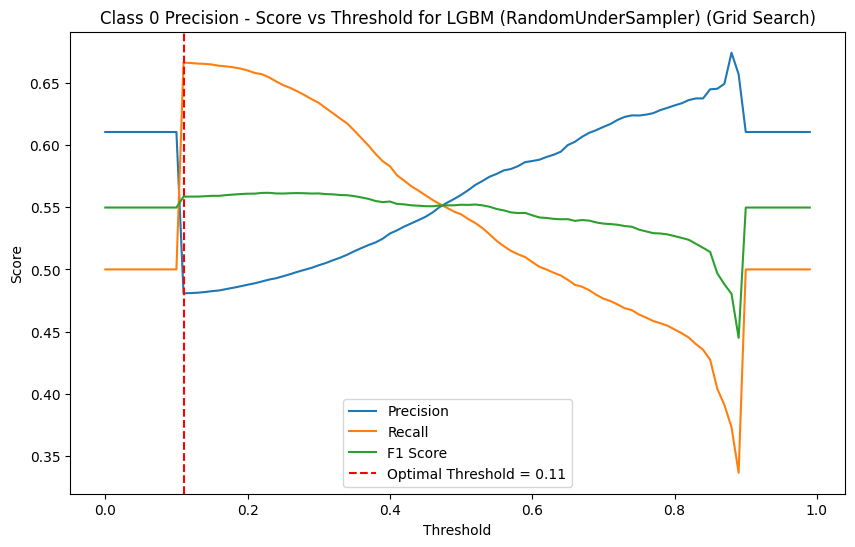

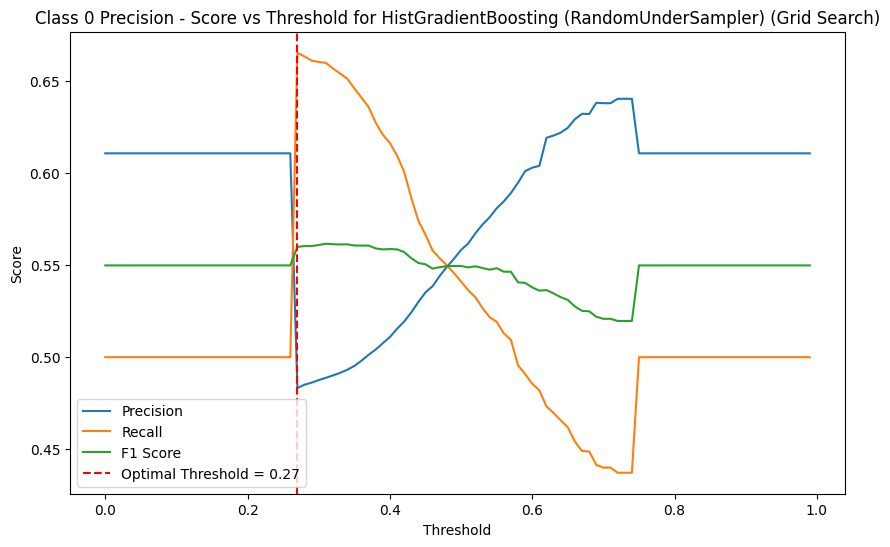

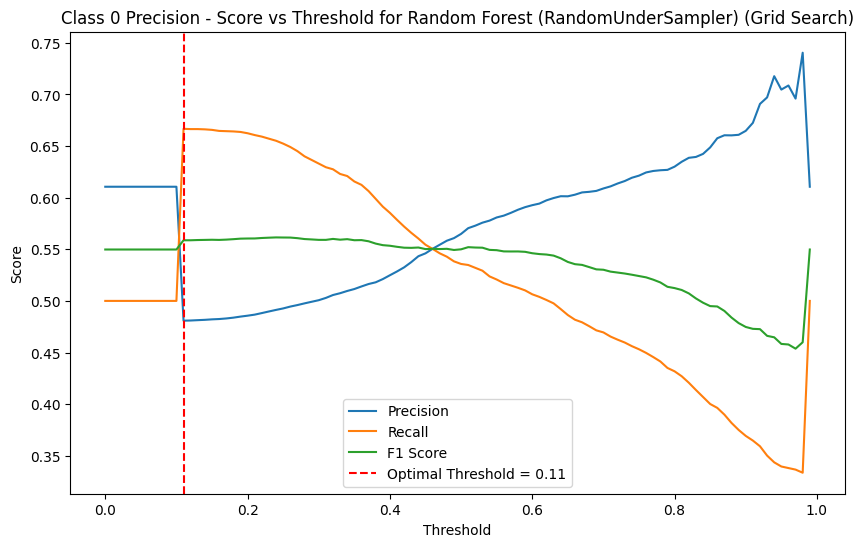

In [20]:
# Evaluate models using grid search for threshold
results_grid_search = evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, grid_search_threshold)

plot_grid_search_results(results_grid_search, optimal_params)

### ROC

<Figure size 1000x600 with 0 Axes>

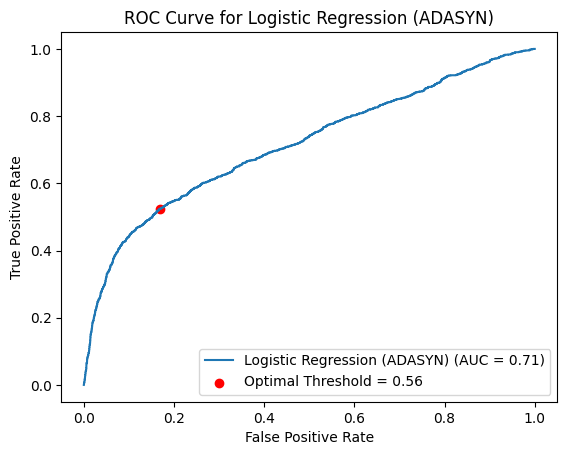

<Figure size 1000x600 with 0 Axes>

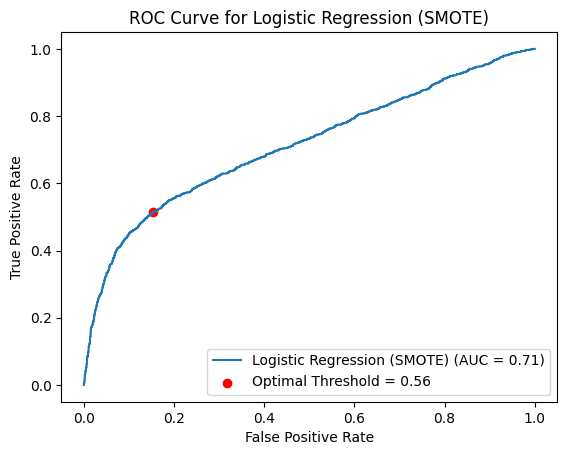

<Figure size 1000x600 with 0 Axes>

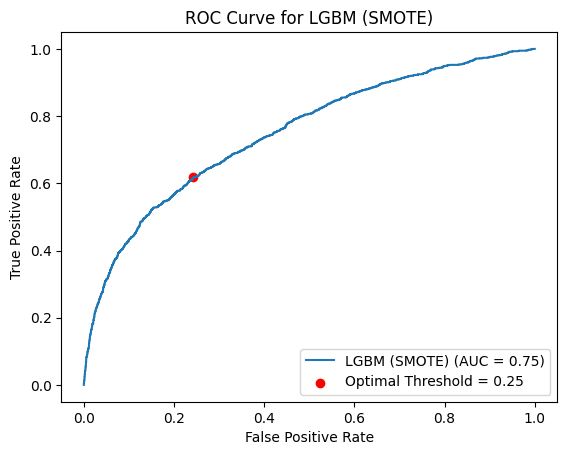

<Figure size 1000x600 with 0 Axes>

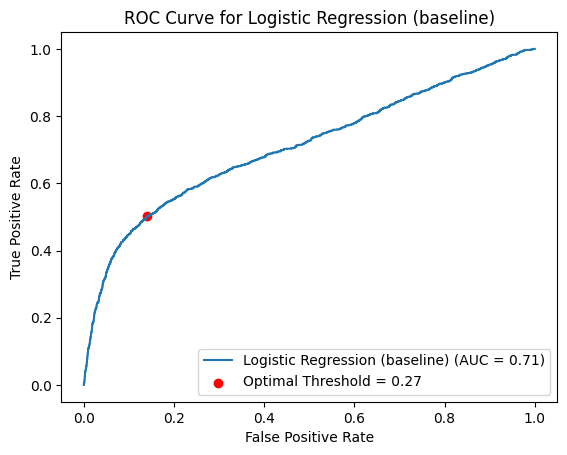

<Figure size 1000x600 with 0 Axes>

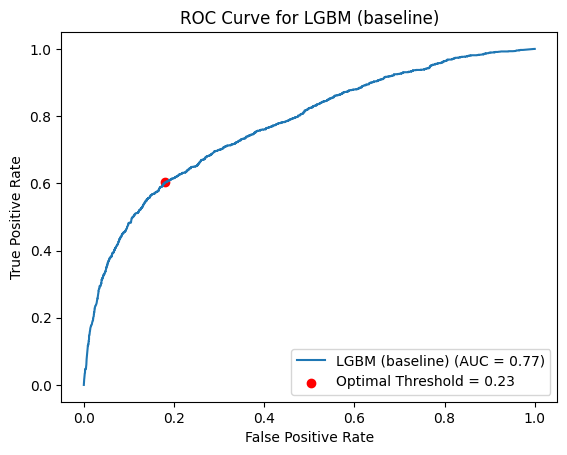

<Figure size 1000x600 with 0 Axes>

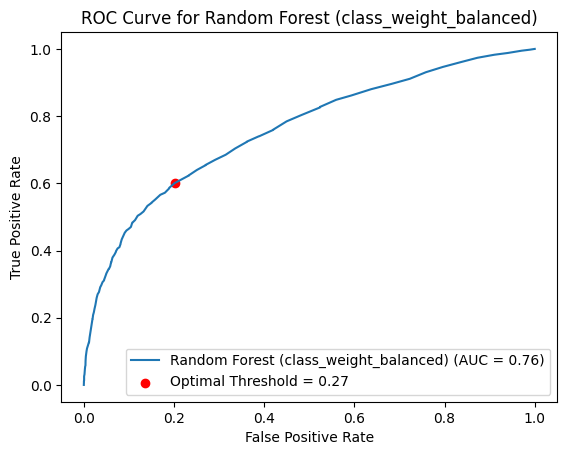

<Figure size 1000x600 with 0 Axes>

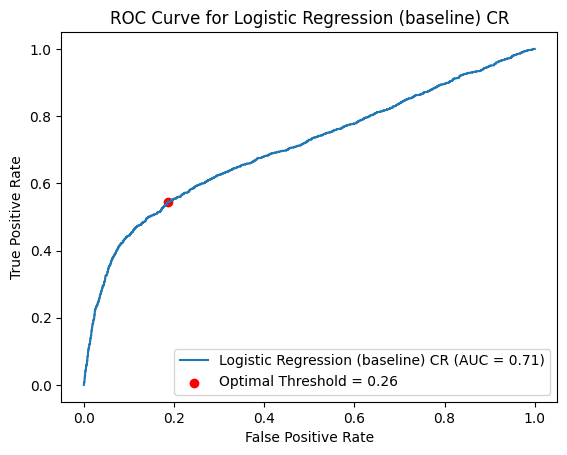

<Figure size 1000x600 with 0 Axes>

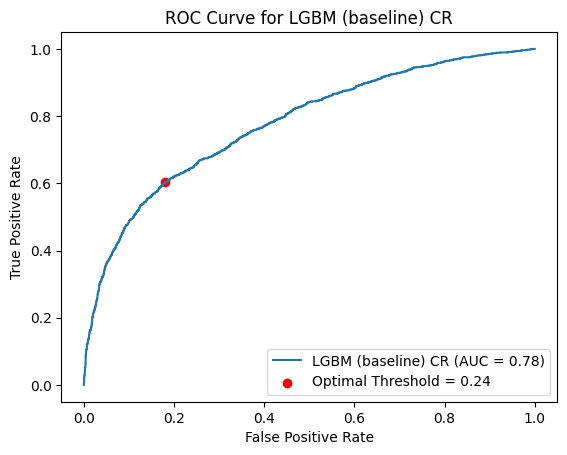

<Figure size 1000x600 with 0 Axes>

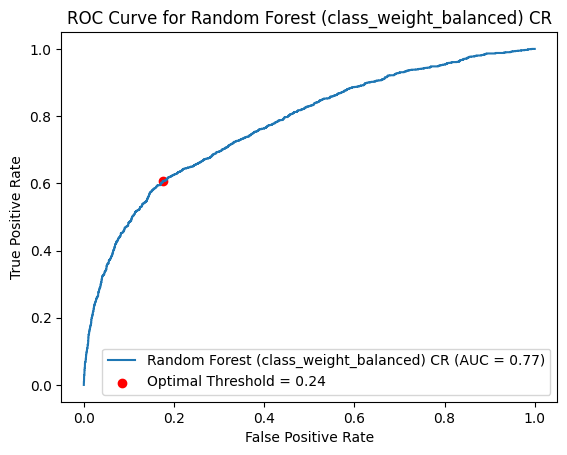

<Figure size 1000x600 with 0 Axes>

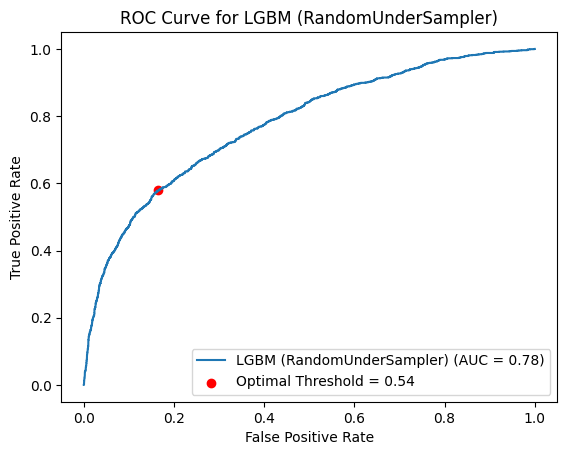

<Figure size 1000x600 with 0 Axes>

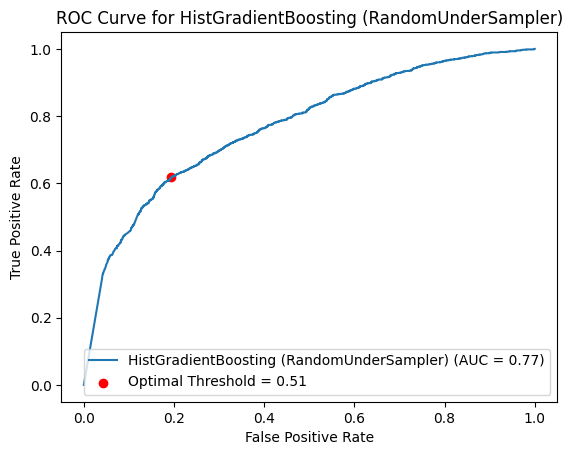

<Figure size 1000x600 with 0 Axes>

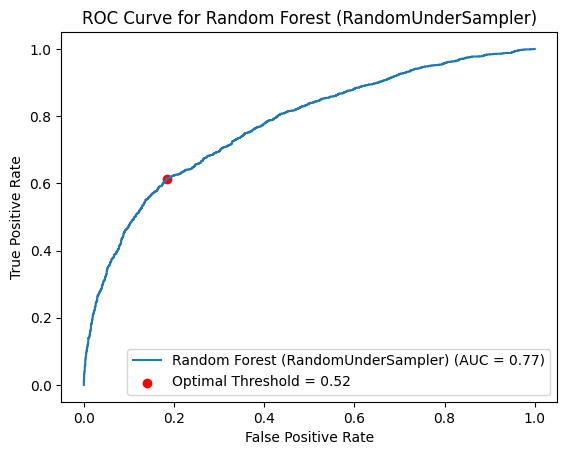

In [28]:
from sklearn.metrics import roc_curve, roc_auc_score
from threshold_utils import evaluate_roc, roc_analysis, plot_roc_results

# Evaluate models using ROC analysis
results_roc = evaluate_roc(models, X_train, y_train, X_test, y_test, preprocessor)

# Plot the ROC results with AUC and best threshold
plot_roc_results(results_roc)

### Save Optimal Thresholds to File

In [27]:
from threshold_utils import update_and_save_optimal_thresholds

update_and_save_optimal_thresholds(optimal_params, results_f1, 'optimal_model_params_thresholds_f1.json')
update_and_save_optimal_thresholds(optimal_params, results_recall, 'optimal_model_params_thresholds_recall.json')
update_and_save_optimal_thresholds(optimal_params, results_custom_loss, 'optimal_model_params_thresholds_custom_loss.json')
update_and_save_optimal_thresholds(optimal_params, results_grid_search, 'optimal_model_params_thresholds_grid_search.json')
update_and_save_optimal_thresholds(optimal_params, results_roc, 'optimal_model_params_thresholds_roc.json')

#### Threshold Utils Script

In [26]:
# function to write script
script_content = r'''

# threshold_utils.py

import numpy as np
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_curve
from imblearn.pipeline import Pipeline as ImbPipeline
from sklearn.base import BaseEstimator, ClassifierMixin
from sklearn.metrics import roc_curve, roc_auc_score

# -------------- Custom Classifier ------------------ #

class CustomTwoThresholdClassifier(BaseEstimator, ClassifierMixin):
    def __init__(self, model, threshold_class_1, threshold_class_0):
        self.model = model
        self.threshold_class_1 = threshold_class_1
        self.threshold_class_0 = threshold_class_0

    def fit(self, X, y):
        self.model.fit(X, y)
        return self

    def predict(self, X):
        probas = self.model.predict_proba(X)
        class_1_indices = probas[:, 1] >= self.threshold_class_1
        class_0_indices = probas[:, 1] < self.threshold_class_0
        predictions = np.zeros(probas.shape[0])
        predictions[class_1_indices] = 1
        predictions[class_0_indices] = 0
        return predictions.astype(int)

    def predict_proba(self, X):
        return self.model.predict_proba(X)


# -------------- Custom Functions ------------------ #

# Function to find optimal threshold for balanced F1 scores
def find_optimal_thresholds(y_true, y_proba):
    precision, recall, thresholds = precision_recall_curve(y_true, y_proba)
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold_class_1 = thresholds[np.argmax(f1_scores)]
    return best_threshold_class_1, precision, recall, f1_scores, thresholds

# Function to find optimal threshold for recall
def find_optimal_threshold_for_recall(y_true, y_proba):
    precision, recall, thresholds = precision_recall_curve(y_true, y_proba)
    f1_scores = 2 * (precision * recall) / (precision + recall)
    best_threshold = thresholds[np.argmax(recall)]
    return best_threshold, precision, recall, f1_scores, thresholds

# Custom Loss Function
def custom_loss(y_true, y_pred, beta=1):
    precision, recall, thresholds = precision_recall_curve(y_true, y_pred)
    # F_beta score with beta>1 weights recall higher than precision
    f_beta_scores = (1 + beta**2) * (precision * recall) / (beta**2 * precision + recall)
    return thresholds[np.argmax(f_beta_scores)], precision, recall, f_beta_scores, thresholds

# Grid Search for Thresholds Function
def grid_search_threshold(y_true, y_proba, thresholds):
    best_threshold = None
    best_score = -np.inf
    best_precision, best_recall = None, None

    precision_list, recall_list, f1_score_list = [], [], []

    for threshold in thresholds:
        y_pred = (y_proba >= threshold).astype(int)
        precision, recall, _ = precision_recall_curve(y_true, y_pred)
        precision_mean = precision.mean()
        recall_mean = recall.mean()
        precision_list.append(precision_mean)
        recall_list.append(recall_mean)
        f1_score = 2 * (precision_mean * recall_mean) / (precision_mean + recall_mean)
        f1_score_list.append(f1_score)
        score = recall_mean  # Focus on maximizing recall

        if score > best_score:
            best_score = score
            best_threshold = threshold
            best_precision = precision
            best_recall = recall

    return best_threshold, precision_list, recall_list, f1_score_list, thresholds

# ROC Analysis Function
def roc_analysis(y_true, y_proba):
    fpr, tpr, thresholds = roc_curve(y_true, y_proba)
    optimal_idx = np.argmax(tpr - fpr)
    optimal_threshold = thresholds[optimal_idx]
    return optimal_threshold, fpr, tpr, thresholds


# -------------- Evaluate Model Functions ------------------ #

def evaluate_models(models, X_train, y_train, X_test, y_test, preprocessor, optimization_function, thresholds=None):
    results = {}
    for name, (model, sampler) in models.items():
        pipeline = ImbPipeline([
            ('preprocessor', preprocessor),
            ('sampler', sampler) if sampler else ('passthrough', None),
            ('classifier', model)
        ])

        pipeline.fit(X_train, y_train)
        y_proba = pipeline.predict_proba(X_test)[:, 1]

        if optimization_function == custom_loss:
            best_threshold, precision, recall, f1_scores, thresholds = optimization_function(y_test, y_proba)
        elif optimization_function == grid_search_threshold:
            if thresholds is None:
                thresholds = np.arange(0.0, 1.0, 0.01)
            best_threshold, precision, recall, f1_scores, thresholds = optimization_function(y_test, y_proba, thresholds)
        elif optimization_function == roc_analysis:
            best_threshold, fpr, tpr, thresholds = optimization_function(y_test, y_proba)
            precision, recall, f1_scores = None, None, None  # Not computed in ROC analysis
        else:
            best_threshold, precision, recall, f1_scores, thresholds = optimization_function(y_test, y_proba)

        results[name] = {
            'model': model,
            'sampler': sampler,
            'best_threshold': best_threshold,
            'precision': precision,
            'recall': recall,
            'f1_scores': f1_scores,
            'thresholds': thresholds
        }
    return results

# -------------- Plot Functions ------------------ #

def plot_results(results, optimal_params):
    for class_metric, models in optimal_params.items():
        for name, result in results.items():
            thresholds = result['thresholds']
            precision = result['precision']
            recall = result['recall']
            f1_scores = result['f1_scores']
            best_threshold = result['best_threshold']

            plt.figure(figsize=(10, 6))
            if precision is not None and recall is not None:
                plt.plot(thresholds, precision[:-1], label='Precision')
                plt.plot(thresholds, recall[:-1], label='Recall')
                plt.plot(thresholds, f1_scores[:-1], label='F1 Score')
            plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Optimal Threshold = {best_threshold:.2f}')
            plt.xlabel('Threshold')
            plt.ylabel('Score')
            plt.title(f'{class_metric} - Thresholds for {name}')
            plt.legend()
            plt.show()

def plot_grid_search_results(results, optimal_params):
    for class_metric, models in optimal_params.items():
        for name, result in results.items():
            thresholds = np.arange(0.0, 1.0, 0.01)
            precision_list = result['precision']
            recall_list = result['recall']
            f1_scores = result['f1_scores']
            best_threshold = result['best_threshold']

            plt.figure(figsize=(10, 6))

            # Plot the metrics for each threshold
            plt.plot(thresholds, precision_list, label='Precision')
            plt.plot(thresholds, recall_list, label='Recall')
            plt.plot(thresholds, f1_scores, label='F1 Score')

            plt.axvline(x=best_threshold, color='r', linestyle='--', label=f'Optimal Threshold = {best_threshold:.2f}')
            plt.xlabel('Threshold')
            plt.ylabel('Score')

            # Use class_metric for the title
            plt.title(f'{class_metric} - Score vs Threshold for {name} (Grid Search)')
            plt.legend()
            plt.show()


# -------------- ROC Functions ------------------ #

# def evaluate_roc(models, X_train, y_train, X_test, y_test, preprocessor):
#     roc_results = {}
#     for name, (model, sampler) in models.items():
#         pipeline = ImbPipeline([
#             ('preprocessor', preprocessor),
#             ('sampler', sampler) if sampler else ('passthrough', None),
#             ('classifier', model)
#         ])

#         pipeline.fit(X_train, y_train)
#         y_proba = pipeline.predict_proba(X_test)[:, 1]
#         fpr, tpr, thresholds = roc_curve(y_test, y_proba)
#         auc = roc_auc_score(y_test, y_proba)
#         optimal_idx = np.argmax(tpr - fpr)
#         optimal_threshold = thresholds[optimal_idx]

#         roc_results[name] = {
#             'fpr': fpr,
#             'tpr': tpr,
#             'thresholds': thresholds,
#             'optimal_threshold': optimal_threshold,
#             'auc': auc
#         }
#     return roc_results

from sklearn.metrics import roc_curve, roc_auc_score

def evaluate_roc(models, X_train, y_train, X_test, y_test, preprocessor):
    roc_results = {}
    for name, (model, sampler) in models.items():
        pipeline = ImbPipeline([
            ('preprocessor', preprocessor),
            ('sampler', sampler) if sampler else ('passthrough', None),
            ('classifier', model)
        ])

        pipeline.fit(X_train, y_train)
        y_proba = pipeline.predict_proba(X_test)[:, 1]
        fpr, tpr, thresholds = roc_curve(y_test, y_proba)
        auc = roc_auc_score(y_test, y_proba)
        optimal_idx = np.argmax(tpr - fpr)
        best_threshold = thresholds[optimal_idx]

        roc_results[name] = {
            'fpr': fpr,
            'tpr': tpr,
            'thresholds': thresholds,
            'best_threshold': best_threshold,
            'auc': auc
        }
    return roc_results


import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

def plot_roc_results(roc_results):
    for name, result in roc_results.items():
        fpr = result['fpr']
        tpr = result['tpr']
        thresholds = result['thresholds']
        optimal_threshold = result['best_threshold']
        auc = result['auc']

        plt.figure(figsize=(10, 6))
        display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=auc, estimator_name=name)
        ax = display.plot()
        # Add vertical line for the optimal threshold
        optimal_idx = np.argmax(tpr - fpr)
        plt.scatter(fpr[optimal_idx], tpr[optimal_idx], c='red', label=f'Optimal Threshold = {optimal_threshold:.2f}')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {name}')
        plt.legend(loc='lower right')
        plt.show()


import json

def update_and_save_optimal_thresholds(optimal_params, results_recall, output_file):
    # Create a copy to update recall thresholds separately
    optimal_params_recall = optimal_params.copy()

    for name, result in results_recall.items():
        if 'Recall' in name:
            if 'Class 1 Recall' in optimal_params_recall:
                if 'Logistic Regression' in name:
                    key = 'Logistic Regression (ADASYN)' if 'ADASYN' in name else 'Logistic Regression (SMOTE)' if 'SMOTE' in name else 'Logistic Regression (baseline)'
                    optimal_params_recall['Class 1 Recall'][key]['best_threshold'] = result['best_threshold']
                elif 'LGBM' in name:
                    key = 'LGBM (SMOTE)' if 'SMOTE' in name else 'LGBM (baseline)'
                    optimal_params_recall['Class 1 Recall'][key]['best_threshold'] = result['best_threshold']
                elif 'Random Forest' in name:
                    key = 'Random Forest (class_weight_balanced)'
                    optimal_params_recall['Class 1 Recall'][key]['best_threshold'] = result['best_threshold']
            else:
                class_0_key = 'Class 0 Recall'
                if 'Logistic Regression' in name:
                    key = 'Logistic Regression (baseline) CR'
                    optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']
                elif 'LGBM' in name:
                    key = 'LGBM (baseline) CR'
                    optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']
                elif 'Random Forest' in name:
                    key = 'Random Forest (class_weight_balanced) CR'
                    optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']
        else:
            class_0_key = 'Class 0 Precision'
            if 'LGBM' in name:
                key = 'LGBM (RandomUnderSampler)'
                optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']
            elif 'HistGradientBoosting' in name:
                key = 'HistGradientBoosting (RandomUnderSampler)'
                optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']
            elif 'Random Forest' in name:
                key = 'Random Forest (RandomUnderSampler)'
                optimal_params_recall[class_0_key][key]['best_threshold'] = result['best_threshold']

    # Save the updated optimal parameters and thresholds to a new JSON file
    with open(output_file, 'w') as file:
        json.dump(optimal_params_recall, file, indent=4)


'''

# Write the script to a file
with open("threshold_utils.py", "w") as file:
    file.write(script_content)

print("Script successfully written to threshold_utils.py")

# reload script to make function available for use
import importlib
import threshold_utils
importlib.reload(threshold_utils)

from threshold_utils import *

Script successfully written to threshold_utils.py


#### Data Utils Script

In [ ]:
script_content=r'''
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
import joblib
import json
import logging
# Suppress warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')
logger = logging.getLogger(__name__)

#--------   Load and Preprocess Data   --------#

def load_data_from_url(url):
    try:
        df = pd.read_excel(url, header=1)
        logging.info("Data loaded successfully from URL.")
    except Exception as e:
        logging.error(f"Error loading data from URL: {e}")
        return None
    return df

def clean_column_names(df):
    df.columns = [col.lower().replace(' ', '_') for col in df.columns]
    return df

def remove_id_column(df):
    if 'id' in df.columns:
        df = df.drop(columns=['id'])
    return df

def rename_columns(df):
    rename_dict = {'pay_0': 'pay_1'}
    df = df.rename(columns=rename_dict)
    return df

def convert_categorical(df, categorical_columns):
    df[categorical_columns] = df[categorical_columns].astype('category')
    return df

def split_features_target(df, target):
    X = df.drop(columns=[target])
    y = df[target]
    return X, y

def load_and_preprocess_data(url, categorical_columns, target):
    df = load_data_from_url(url)
    if df is not None:
        df = clean_column_names(df)
        df = remove_id_column(df)
        df = rename_columns(df)
        df = convert_categorical(df, categorical_columns)
        X, y = split_features_target(df, target)
        return X, y
    return None, None

#--------   Plot Class Distribution   --------#


def plot_class_distribution(y_train, target_name):
    plt.figure(figsize=(8, 5))
    sns.countplot(x=y_train, hue=y_train, palette='mako')
    plt.title(f'Class Distribution in Training Set: {target_name}')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.legend([], [], frameon=False)

    # Calculate the percentage for each class
    total = len(y_train)
    class_counts = y_train.value_counts()
    for i, count in enumerate(class_counts):
        percentage = 100 * count / total
        plt.text(i, count, f'{percentage:.1f}%', ha='center', va='bottom')

    plt.show()

def plot_mean_class_metrics(df):
    """
    Function to calculate and plot the mean recall and precision metrics for class 0 and class 1.
    """
    # Calculate the mean of recall and precision for both classes
    metrics_df = pd.DataFrame({
        'Metric': ['Recall_0', 'Precision_0', 'Recall_1', 'Precision_1'],
        'Mean Value': [
            df['Recall_0'].mean(),
            df['Precision_0'].mean(),
            df['Recall_1'].mean(),
            df['Precision_1'].mean()
        ]
    })

    # Plot the mean of recall and precision for each class
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Metric', y='Mean Value', data=metrics_df, palette='mako')
    plt.title('Mean Recall and Precision for Class 0 and Class 1')
    plt.xlabel('Metric')
    plt.ylabel('Mean Value')
    for index, row in metrics_df.iterrows():
        plt.text(index, row['Mean Value'], f'{row["Mean Value"]:.2f}', ha='center', va='bottom')
    plt.show()

#--------   Evaluate and Capture Metrics   --------#


# Function to evaluate model
def evaluate_model(pipeline, X_train, X_test, y_train, y_test, model_name, experiment_name):
    logger.info(f"Training and evaluating model: {model_name} ({experiment_name})")

    # Fit the pipeline
    pipeline.fit(X_train, y_train)

    # Make predictions
    y_pred = pipeline.predict(X_test)

    # Capture classification report
    report = classification_report(y_test, y_pred, output_dict=True)

    # Extract relevant metrics
    metrics = {
        'Model': model_name,
        'Experiment': experiment_name,
        'Recall_0': report['0']['recall'],
        'Precision_0': report['0']['precision'],
        'F1_0': report['0']['f1-score'],
        'Recall_1': report['1']['recall'],
        'Precision_1': report['1']['precision'],
        'F1_1': report['1']['f1-score'],
        'F1_Macro': report['macro avg']['f1-score'],
        'Accuracy': report['accuracy']
    }
    return metrics

def compile_metrics(metrics_list, experiment_name='experiment_name'):
    metrics_df = pd.DataFrame(metrics_list)
    csv_filename = f'{experiment_name}_metrics.csv'
    metrics_df.to_csv(csv_filename, index=False)
    logger.info(f"Metrics saved to {csv_filename}")
    return metrics_df


def clean_params(params):
    """
    Clean the model parameters by removing the 'classifier__' prefix.
    """
    return {key.replace('classifier__', ''): value for key, value in params.items()}

# --------   Get Top Performers   --------#

import pandas as pd
def get_top_performers(metrics_df, top_n=3):
    metrics = ['Recall_0', 'Precision_0', 'Recall_1', 'Precision_1']
    top_performers = []

    for metric in metrics:
        sorted_df = metrics_df[['Experiment', 'Model', metric]].sort_values(by=metric, ascending=False).head(top_n)
        sorted_df['Metric'] = metric
        sorted_df = sorted_df.rename(columns={metric: 'Value'})
        top_performers.append(sorted_df)

    # Concatenate all top performers into a single DataFrame
    top_performers_df = pd.concat(top_performers, ignore_index=True)

    # Save the results to a CSV file
    top_performers_df.to_csv('top_performing_models.csv', index=False)
    return top_performers_df

def select_and_sort_top_n(df, columns, n=3):
    """
    Selects the top n rows based on each specified column and returns a DataFrame with all columns.

    Args:
    df (pd.DataFrame): The input DataFrame.
    columns (list of str): The columns to sort by.
    n (int): The number of top rows to select for each column.

    Returns:
    pd.DataFrame: A DataFrame containing the top n rows for each specified column, without duplicates.
    """
    top_n_combined_df = pd.DataFrame()

    for column in columns:
        top_n = df.nlargest(n, column)
        top_n_combined_df = pd.concat([top_n_combined_df, top_n])

    # Drop duplicates and reset index
    top_n_combined_df = top_n_combined_df.drop_duplicates().reset_index(drop=True)

    return top_n_combined_df

'''

# Write the script to a file
with open("loan_data_utils.py", "w") as file:
    file.write(script_content)

print("Script successfully written to loan_data_utils.py")
# Reload script to make functions available for use
import importlib
import loan_data_utils
importlib.reload(loan_data_utils)

from loan_data_utils import *